In [2]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy import io
import scipy.io as sio
%matplotlib inline 
import pylab
import csv
from Tkinter import Tk
from tkFileDialog import askopenfilename
from tkFileDialog import askdirectory
import nibabel as nb
from scipy import io
import nibabel as nb
from scipy.interpolate import interp1d
from scipy import ndimage

In [3]:
from sklearn import linear_model

# Open data

In [4]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/media/DataPaper/100135/100135ss2oncregcdFF20skf99Smith0_4_60TSint.mat


In [5]:
Ua=sio.loadmat(filename)
DT=Ua['TS2']
DT.shape

(11168, 99)

In [6]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/media/DataPaper/100135/100135ss2oncregcdFF20skf99Smith0_4_60TSzmapint.mat


In [8]:
Ua=sio.loadmat(filename)
DTzmap=Ua['TS2zmap']
DT.shape

(11168, 99)

In [9]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename2 = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename2)

/media/DataPaper/100135/100135ss2oncregcdFF20skf99Smith0_4_60IC.nii


In [10]:
img1 = nb.load(filename2)
data = img1.get_data()

In [11]:
S=data.shape
S

(138, 83, 26, 99)

In [15]:
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/media/DataPaper/100135/Behavior/100135controlb_2016-05-17-191711-0000TimeFluoOn.mat


In [16]:
Ua=sio.loadmat(filename)

In [17]:
Time=Ua['TimeFluoOnVid']

In [18]:
Time.shape

(11890, 1)

In [39]:
Time_fluoICA=Time[7:11175]
Time_fluoICA.shape

(11168, 1)

Z-score

In [20]:
Demean=np.zeros(S)
Dmaps=np.zeros(S)
Dvar=np.zeros(S)
Var=np.zeros(S[3])
D2=np.zeros([S[0],S[1],5,S[3]])
Tvar=np.zeros(S[3])

In [21]:
for i in range(S[3]):
    Demean[:,:,:,i]=data[:,:,:,i]-np.mean(np.mean(np.mean(data[:,:,:,i],0),0),0)

In [22]:
for i in range(S[3]):
    Dsq=np.reshape(Demean[:,:,:,i],S[0]*S[1]*S[2])
    Var[i]=np.sqrt(np.var(Dsq))
    Dvar=Demean[:,:,:,i]/Var[i]
    Dmaps[:,:,:,i]=Dvar-2.5
    Tvar[i]=np.var(DT[i,:])
Dmaps[Dmaps<0]=0

In [40]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/media/DataPaper/100135/Behavior/100135Xk.mat


In [41]:
Ua=sio.loadmat(filename)

In [42]:
Xk=Ua['Xk']

# Open Masks

In [26]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filenameM = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filenameM)
img1 = nb.load(filenameM)
Masks = img1.get_data()
Sm=Masks.shape
Masks=np.array(Masks)

/media/DataPaper/100135/Registration/JFRC100135Transformedseparate.nii


In [27]:
filenameM='/home/sophie/Downloads/RegionList'
with open(filenameM) as f:
    content = f.readlines()
Names=[Line.split('\t') for Line in content]
RegionName=[Names[i][0] for i in range(75)]
Num=[int(Names[i][2]) for i in range(75)]

# Average in masks to sort components by brain region

In [28]:
Dmaps.shape

(138, 83, 26, 99)

In [29]:
M=np.zeros((S[3],86))
Mapmean=np.zeros(S[3])
MMasks=np.zeros(86)

In [30]:
for i in range(S[3]):
    Mapmean[i]=np.mean(np.mean(np.mean(Dmaps[:,:,:,i])))
    for j in range(86):
        MMasks[j]=np.mean(np.mean(np.mean(Masks[:,:,:,j])))
        if MMasks[j]:
            #M[i,j]=np.mean(np.mean(np.mean(Masks[:,:,:,j]*Dmaps[:,:,:,i])))/(MMasks[j]*Mapmean[i])
            M[i,j]=np.mean(np.mean(np.mean(Masks[:,:,:,j]*Dmaps[:,:,:,i])))/(Mapmean[i])

In [31]:
CompMainName=S[3]*['']
CompNameAdd=np.zeros((S[3],86))
for i in range(S[3]):
    Max=np.max(M[i,:])
    I=np.argmax(M[i,:])+1
    for j in range(86):
        J=[l for l in range(74) if Num[l]==(j+1)]
        if M[i,j]>0.2*Max:
            CompNameAdd[i,J]=1
    J=[l for l in range(75) if Num[l]==I]
    CompMainName[i]=Names[np.array(J)][0]

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:11: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future


In [32]:
Time_fluoICA.shape

(11171, 1)

In [33]:
Time_fluoICA=Time_fluoICA.T

In [34]:
Time_fluoICA.shape

(1, 11171)

In [35]:
Xk=Xk.T

In [44]:
np.max(Time_fluoICA)

112.92881968012021

LO_R
LH_R
LOP_L
90
LO_R
LO_L
SLP_L
SMP_L
94
lobula


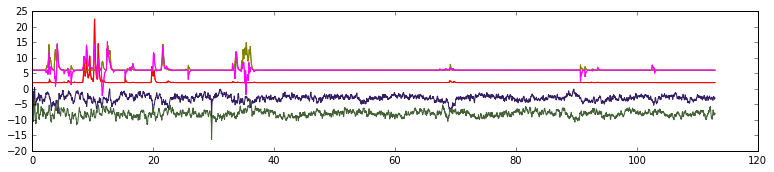

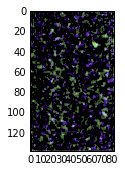

PB
7
PB
ATL_L
16
protocerebral bridge


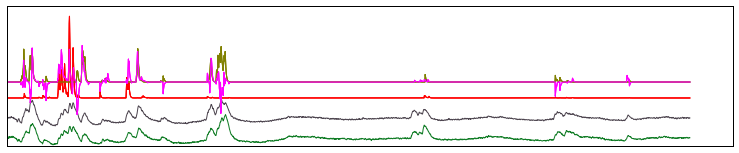

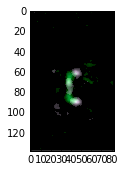

LAL_R
37
lateral accessory lobe


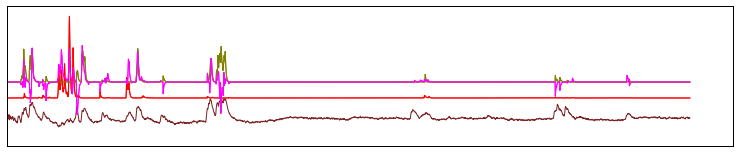

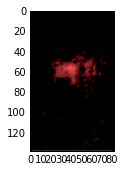

IB_R
SPS_R
36
inferior bridge


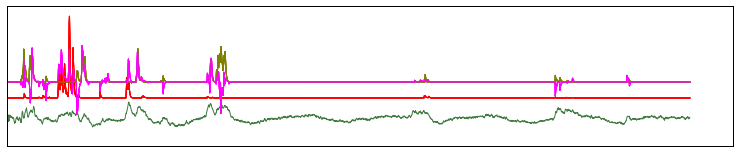

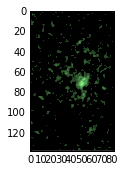

MB_VL_R
MB_VL_L
55
vertical lobe of adult mushroom body


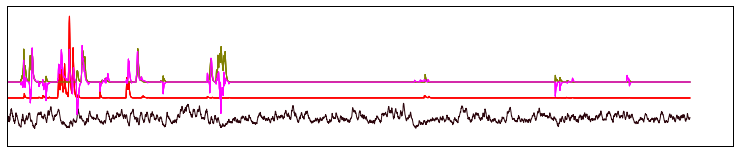

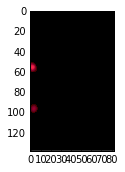

LO_R
LOP_R
2
lobula plate


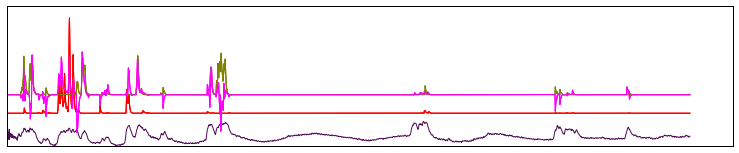

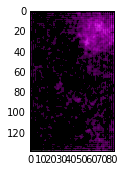

EB
FB
SMP_R
18
ellipsoid body


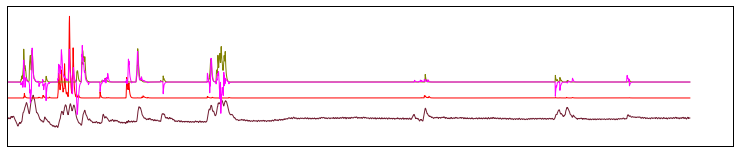

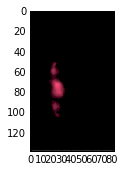

ME_R
50
ME_R
SPS_L
52
LO_R
ICL_R
ME_R
SPS_R
60
LO_R
ME_R
65
LO_R
LH_R
ME_R
SMP_R
66
medulla


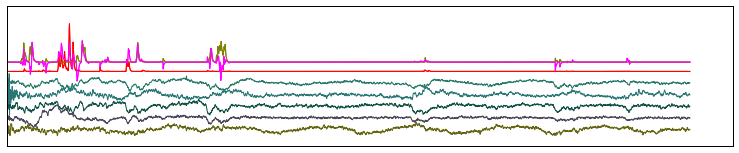

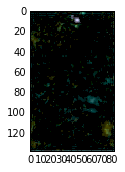

FB
SMP_R
SMP_L
24
FB
34
FB
56
fan-shaped body


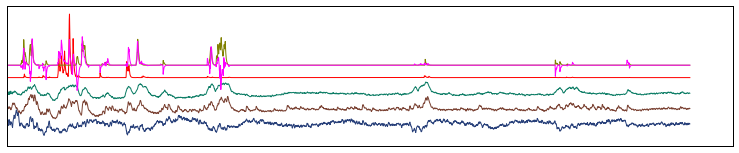

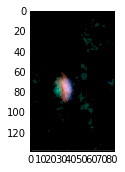

LH_R
SLP_R
PLP_R
SCL_R
15
superior lateral protocerebrum


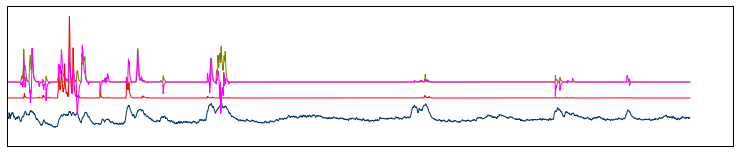

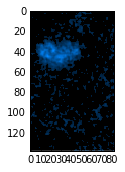

MB_VL_R
SIP_R
MB_VL_L
SIP_L
44
superior intermediate protocerebrum


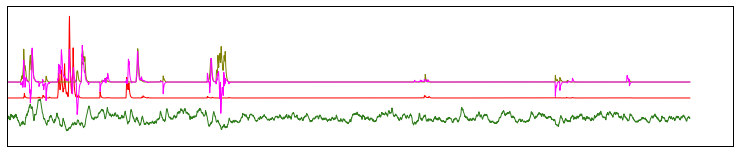

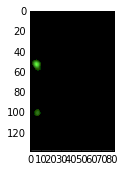

SMP_R
19
ATL_R
SMP_R
31
SIP_R
SMP_R
51
FB
SMP_R
SMP_L
59
SMP_R
SPS_R
SLP_L
SMP_L
68
superior medial protocerebrum


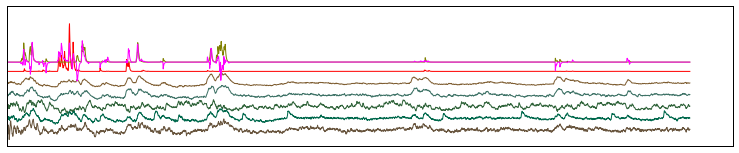

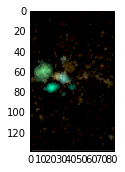

LO_R
PLP_R
1
ICL_R
PLP_R
SPS_R
4
PLP_R
PLP_L
5
PLP_R
SPS_R
33
LO_R
LOP_R
PLP_R
PLP_L
62
posterior lateral protocerebrum


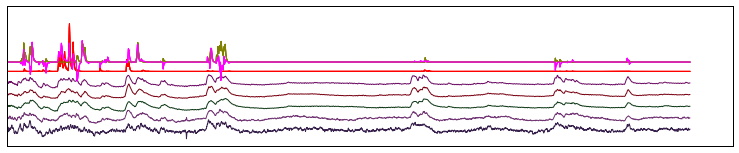

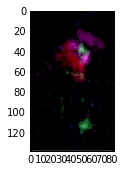

IB_R
SPS_R
SMP_L
17
SPS_R
IPS_R
SPS_L
23
IB_R
SPS_R
SPS_L
25
SPS_R
35
SMP_R
SPS_R
38
SPS_R
39
SPS_R
45
superior posterior slope


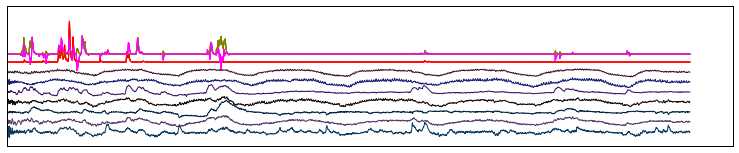

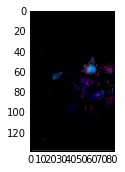

GNG
SMP_L
9
SPS_R
GNG
SPS_L
21
MB_CA_R
GNG
MB_CA_L
28
GNG
53
ME_R
GNG
72
GNG
76
GNG
87
adult gnathal ganglion


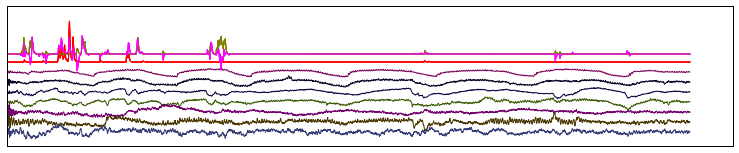

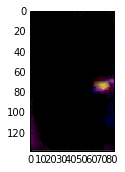

LO_L
LOP_L
0
PLP_R
LO_L
PLP_L
6
lobula


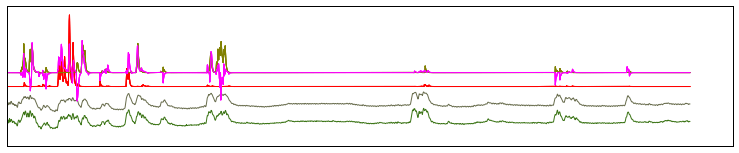

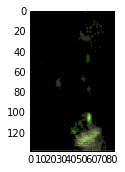

LH_L
89
lateral horn


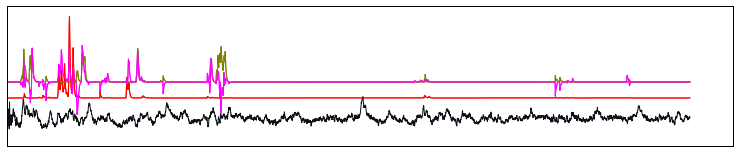

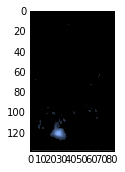

MB_VL_L
SIP_L
SMP_L
78
vertical lobe of adult mushroom body


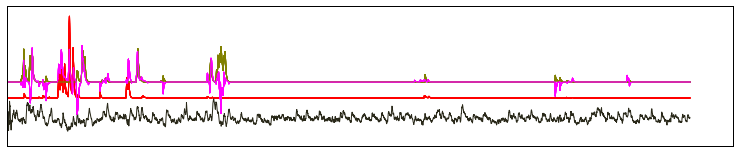

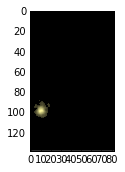

ATL_L
SMP_L
32
SMP_L
41
CRE_L
SMP_L
61
SMP_R
SMP_L
63
SMP_R
SMP_L
64
superior medial protocerebrum


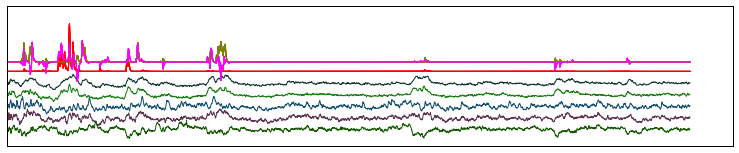

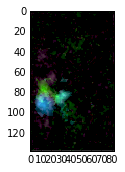

PLP_R
LO_L
PLP_L
SPS_L
12
PLP_L
MB_CA_L
13
LH_R
IPS_R
PLP_L
49
posterior lateral protocerebrum


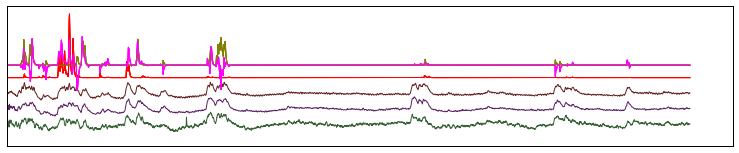

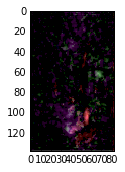

ICL_L
PLP_L
SPS_L
3
ICL_L
SPS_L
20
LO_L
SPS_L
27
LOP_R
ME_R
SPS_R
SPS_L
43
superior posterior slope


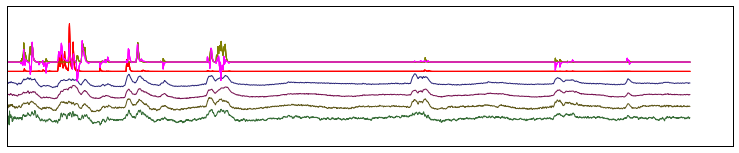

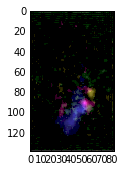

SPS_L
IPS_L
8
inferior posterior slope


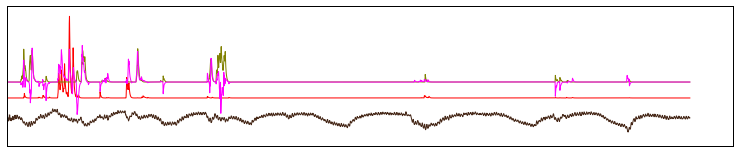

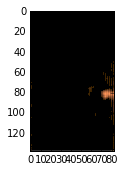

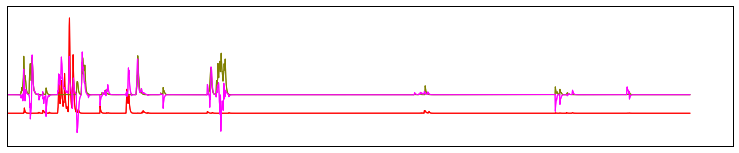

In [43]:
pylab.rcParams['figure.figsize'] = (13, 2.5)

h=5
tot=0
GoodICAnat=np.zeros(S[3])

for l in range(74):
    Final_maps=np.zeros((S[0],S[1],3))
    Fmap=np.zeros((S[0],S[1],3))
    C=np.zeros(3)

    n=0
    for i in range(len(CompMainName)):                    
        Dmmv=np.mean(data[:,:,:,i],2) 
        Dmmv[Dmmv<0.2*np.max(np.max(np.max(Dmmv)))]=0
        C=np.squeeze(np.random.rand(3,1))
        labeled, nrobject=ndimage.label(Dmmv>0)
        
        if CompMainName[i]==Names[l][0] and (sum(CompNameAdd[i,:])<5) and nrobject<400:
            n=n+1            
            
            for k in range(3):
                Fmap[:,:,k]=0.7*Dmmv*C[k]/np.max(C)
            Final_maps=Final_maps+Fmap
            plt.plot(Time_fluoICA,(DT[:,i]/np.sqrt(np.var(DT[:,i]))-h*n+2),color=C/2)        
            tot=tot+1
            GoodICAnat[i]=1
            #print(i)
            for j in range(86):
                if CompNameAdd[i,j]==1:                
                    print(Names[np.array(j)][0])
            print(i)
            
    plt.plot(Time_fluoICA,Xk[:,0]/np.std(Xk[:,0])+2,color=(1,0,0))   
    plt.plot(Time_fluoICA,Xk[:,1]/np.std(Xk[:,1])+6,color=(0.5,0.5,0))
    plt.plot(Time_fluoICA,Xk[:,2]/np.std(Xk[:,2])+6,color=(1,0,1))

    #plt.plot(Time_fluoICA.T,2*Xk[:,2]/np.max(Xk[:,2])+1.5,color=(1,0,1))    
    if n!=0:
        print(Names[l][1])

        plt.show()
        FM=Final_maps/np.max(np.max(Final_maps))
        FM[FM<0.1]=0
        plt.imshow(FM,interpolation='none')
        plt.show()
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)

In [45]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filenamet = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filenamet)
nimt=nb.load(filenamet)
Dtemp=np.squeeze(nimt.get_data())
Dtemp.shape

/media/DataPaper/100135/100135GreyTemplate.nii


(138, 83, 26)

# Reorder by larger sub-regions (~ presumed stimulus to motor)

In [46]:
LargerRegionsDic={'':'','AME_R':'OL','LO_R':'OL','NO':'CX','BU_R':'CX','PB':'CX','LH_R':'LH','LAL_R':'LX','SAD':'PENP'
               ,'CAN_R':'PENP','AMMC_R':'PENP','ICL_R':'INP','VES_R':'VMNP','IB_R':'INP','ATL_R':'INP','CRE_R':'INP'
               ,'MB_PED_R':'MB','MB_VL_R':'MB','MB_ML_R':'MB','FLA_R':'PENP','LOP_R':'OL','EB':'CX','AL_R':'AL',
                'ME_R':'OL','FB':'CX','SLP_R':'SNP','SIP_R':'SNP','SMP_R':'SNP','AVLP_R':'VLNP','PVLP_R':'VLNP',
                'IVLP_R':'VLNP','PLP_R':'VLNP','AOTU_R':'VLNP','GOR_R':'VMNP','MB_CA_R':'MB','SPS_R':'VMNP',
                'IPS_R':'VMNP','SCL_R':'INP','EPA_R':'VMNP','GNG':'GNG','PRW':'PENP','GA_R':'LX','AME_L':'OL'
                ,'LO_L':'OL','BU_L':'CX','LH_L':'LH','LAL_L':'LX','CAN_L':'PENP','AMMC_L':'PENP','ICL_L':'INP',
                'VES_L':'VMNP','IB_L':'INP','ATL_L':'INP','CRE_L':'INP','MB_PED_L':'MB','MB_VL_L':'MB',
                'MB_ML_L':'MB','FLA_L':'PENP','LOP_L':'OL','AL_L':'AL','ME_L':'OL','SLP_L':'SNP','SIP_L':'SNP',
                'SMP_L':'SNP','AVLP_L':'VLNP','PVLP_L':'VLNP','IVLP_L':'VLNP','PLP_L':'VLNP','AOTU_L':'VLNP',
                'GOR_L':'VMNP','MB_CA_L':'MB','SPS_L':'VMNP','IPS_L':'VMNP','SCL_L':'INP','EPA_L':'VMNP','GA_L':'LX'}

In [47]:
SmallRegionsSorted=['ME_L','ME_R','LO_R','LO_L','LOP_R','LOP_L','AME_R','AME_L',
                  'PLP_R','PLP_L','PVLP_R','PVLP_L','AVLP_R','AVLP_L','AOTU_R','AOTU_L','IVLP_R','IVLP_L',
                  'AL_R','AL_L',
                  'MB_CA_R','MB_CA_L','MB_PED_R','MB_PED_L','MB_VL_R','MB_VL_L','MB_ML_R','MB_ML_L',
                  'SMP_R','SMP_L','SIP_R','SLP_L','SLP_R','SIP_L',
                  'LH_R','LH_L',                  
                  'CRE_R','CRE_L','ICL_R','ICL_L','SCL_R','SCL_L','IB_R','IB_L','ATL_R','ATL_L',
                  'EB','PB','NO','FB',
                  'BU_R','BU_L','LAL_R','LAL_L','GA_R','GA_L',
                  'GOR_R','GOR_L','EPA_R','EPA_L','VES_R','VES_L','SPS_R','SPS_L','IPS_R','IPS_L',
                  'AMMC_R','AMMC_L','SAD','FLA_R','FLA_L','PRW','CAN_R','CAN_L',
                  'GNG','']

In [48]:
Tozip=range(len(SmallRegionsSorted))
SmallRegionsDic=dict(zip(SmallRegionsSorted,Tozip))

In [49]:
LargerRegionInd={ 'OL':1,'VLNP':2,'VMNP':3,'AL':4,'MB':5,'LH':6,'SNP':7,'CX':8,'LX':9,'INP':10,'PENP':11,'GNG':12,'':13}

In [50]:
LargerRegion=[LargerRegionsDic[CompMainName[i]] for i in range(S[3])]

In [51]:
LargerRegionI=np.array([LargerRegionInd[LargerRegion[i]] for i in range(S[3])])

In [52]:
SmallRegion=np.array([SmallRegionsDic[CompMainName[i]] for i in range(S[3])])

In [53]:
NewOrder=np.argsort(SmallRegion)

# Import VFB database

In [54]:
from rpy2 import robjects

In [55]:
robjects.r['load']('/home/sophie/JefferisData.Rdata')
JefferisData=robjects.r['x']
e=np.array(JefferisData)
enorm=e[10:85,:].astype(float)
for i in range(75):
    enorm[i,:]=np.divide(enorm[i,:],np.max(enorm[i,:]))
#enorm[enorm<0.1]=0

In [56]:
set(e[4,:])

{'5-HT1B-Gal4',
 'Cha-Gal4',
 'G0239-Gal4',
 'GH146-Gal4',
 'Gad1-Gal4',
 'TH-Gal4',
 'Tdc2-Gal4',
 'Trh-Gal4',
 'VGlut-Gal4',
 'fru-Gal4',
 'npf-GAL4'}

In [57]:
S2=M.shape
M2=np.zeros((S2[0],75))
for j in range(86):
    J=np.array([l for l in range(75) if Num[l]==j+1])
    if J.shape[0] != 0:
        J=J[0]
        M2[:,J]=M[:,j]
Mnorm=M2
for i in range(75):
    Mnorm[j,i]=M2[j,i]/np.max(M2[:,i])
#Mnorm[Mnorm<0.1]=0

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:10: RuntimeWarning: invalid value encountered in double_scalars


In [58]:
Scores=np.zeros((enorm.shape[1],M2.shape[0]))
for i in range(enorm.shape[1]):
    for j in range(M2.shape[0]):
        #Scores[i,j]=np
        #Scores[i,j]=np.inner(enorm[:,i],Mnorm[j,:])
        Scores[i,j]=sum((enorm[:,i]*Mnorm[j,:]))
        #Scores[i,j]=-sum(abs(enorm[:,i]-Mnorm[j,:]))        

In [59]:
ScoresTH=np.zeros((enorm.shape[1],M2.shape[0]))-18
for i in range(enorm.shape[1]):
    for j in range(M2.shape[0]):
        if e[4,i]=='TH-Gal4':
            ScoresTH[i,j]=np.inner(enorm[:,i],Mnorm[j,:])
            #ScoresTH[i,j]=-sum(abs(enorm[:,i]-Mnorm[j,:]))

In [60]:
import csv
i=0
NeuronName=[]
with open('/home/sophie/fc_name_mapping.csv') as f:
    file_read = csv.reader(f)
    for row in file_read:
        NeuronName.append(row[3])
        i=i+1

# Last pruning by hand

In [61]:
%%javascript
IPython.OutputArea.auto_scroll_threshold =4000;

<IPython.core.display.Javascript object>

In [62]:
if S[2]>5:
    Nstack=5
    Int100=[(i+1)*100/Nstack for i in range(Nstack)]
    Percs=np.percentile(range(S[2]),Int100)
    Indices=np.split(range(S[2]),Percs)
    D1=np.zeros([S[0],S[1],Nstack])
    Dmean=np.squeeze(data[:,:,range(Nstack),2])
    for i in range(Nstack):
        Vmean=np.mean(Dtemp[:,:,Indices[i]],2)
        Dmean[:,:,i]=Vmean
else:
    Nstack=S[2]
    D1=np.zeros([S[0],S[1],S[2]])
    Dmean=data[:,:,range(S[2])]  
    Dmean=np.squeeze(Dtemp[:,:,:])

/usr/local/lib/python2.7/dist-packages/numpy/lib/shape_base.py:422: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  sub_arys.append(_nx.swapaxes(sary[st:end], axis, 0))


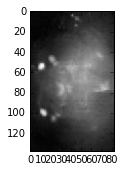

In [63]:
plt.imshow(Dmean[:,:,1],cmap=plt.cm.gray)

In [64]:
my_cmap=plt.cm.jet
my_cmap.set_bad(alpha=0)
Good_ICs=np.zeros(S[3])
Label_ICs=[]
pylab.rcParams['figure.figsize'] = (15, 2.5)

In [65]:
algorithm = linear_model.LinearRegression()

In [66]:
Sxk=Xk.shape

In [67]:
Sxk

(11168, 3)

In [71]:
Xk=Xk.T

In [69]:
X=np.zeros((Sxk[0],3))

In [72]:
X[:,0]=(Xk[:,0]-np.mean(Xk[:,0]))/np.std(Xk[:,0])
X[:,1]=(Xk[:,1]-np.mean(Xk[:,1]))/np.std(Xk[:,1])
X[:,2]=(Xk[:,2]-np.mean(Xk[:,2]))/np.std(Xk[:,2])

In [73]:
X.shape

(11168, 3)

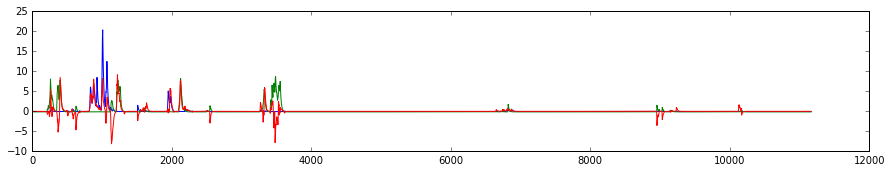

In [74]:
plt.plot(X)

0
LO_L


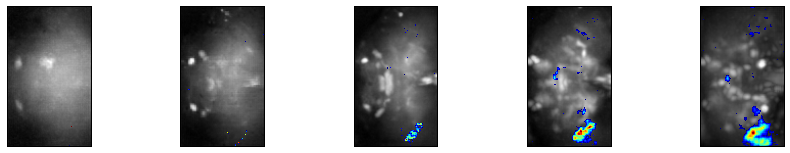

('left:', 0.09012339723991096, 'right:', 0.20853236180877577, 'walk:', 0.0030253415948854334)
0.240956528088
VGlut-F-200253
VGlut-F-300025
TH-M-000026
TH-F-200091


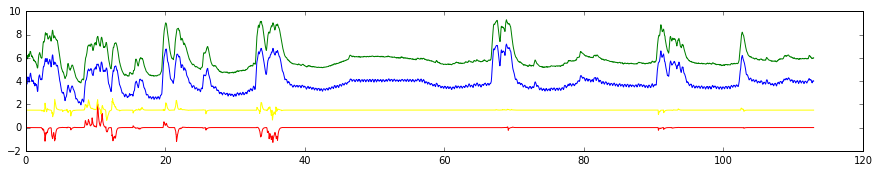

a
1
PLP_R


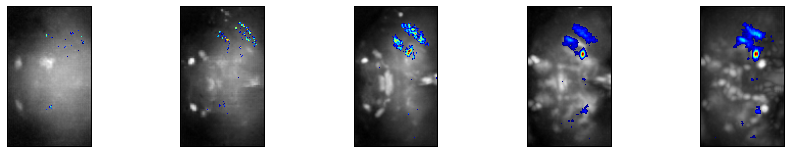

('left:', 0.085907038434113611, 'right:', 0.15579651768223818, 'walk:', 0.0051752027129830513)
0.257025657532
TH-F-100105
VGlut-F-100092
TH-F-100105
TH-M-800000


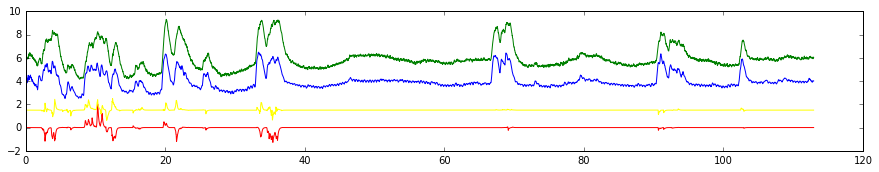

a
2
LOP_R


/usr/local/lib/python2.7/dist-packages/numpy/ma/core.py:4185: UserWarning: Warning: converting a masked element to nan.
  warnings.warn("Warning: converting a masked element to nan.")


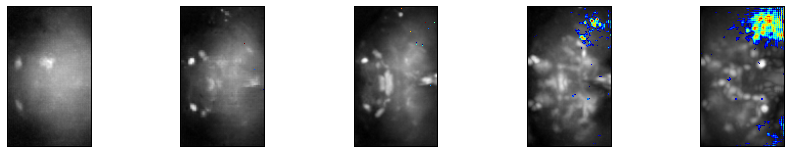

('left:', 0.059764071281837403, 'right:', 0.12527099296018315, 'walk:', -0.0012644812253598536)
0.209806385659
VGlut-F-700175
VGlut-F-500422
TH-F-000032
TH-F-000038


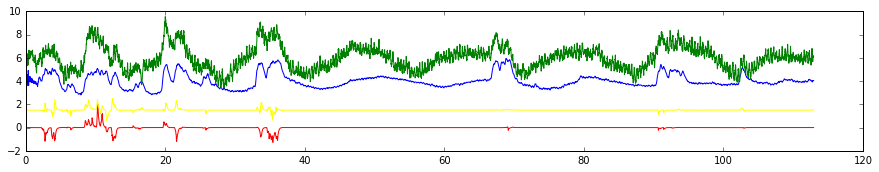


3
SPS_L


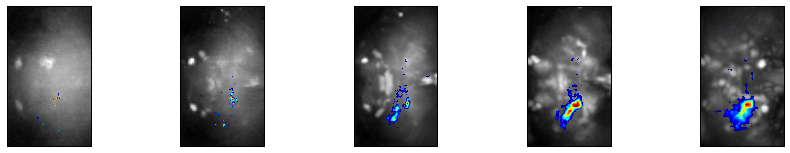

('left:', 0.060530081575970389, 'right:', 0.11522952345581311, 'walk:', 0.0062805606973959927)
0.209712565788
VGlut-F-900065
TH-M-000059
TH-M-000059
TH-F-200035


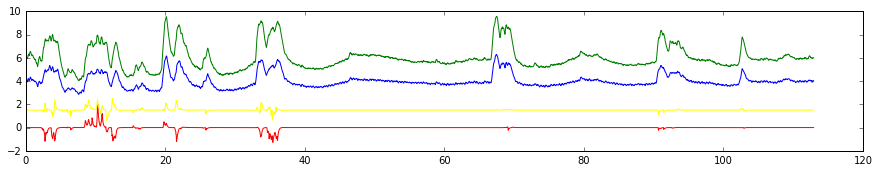

a
4
PLP_R


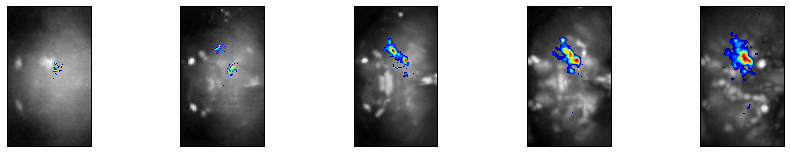

('left:', 0.068066755654628969, 'right:', 0.11436995598143282, 'walk:', 0.0049567714435980736)
0.221953201578
TH-F-100005
TH-F-100105
TH-F-100005
TH-F-100105


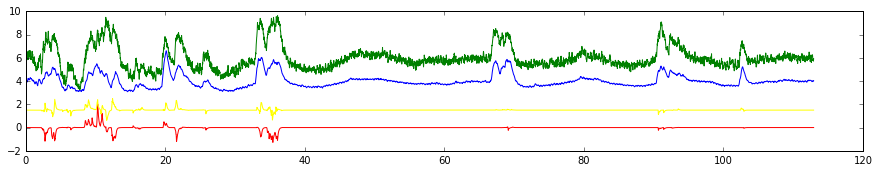

a
5
PLP_R


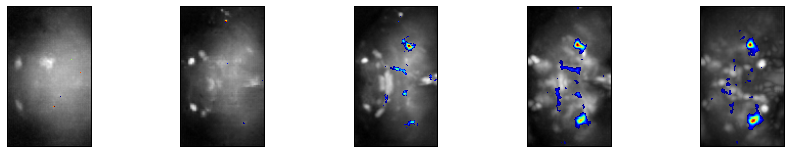

('left:', 0.078819744340915376, 'right:', 0.13290079271141159, 'walk:', -0.011192382420960295)
0.281198417774
TH-F-100105
VGlut-F-100092
TH-F-100105
TH-F-100005


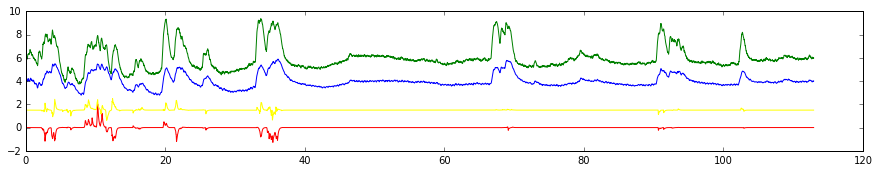

a
6
LO_L


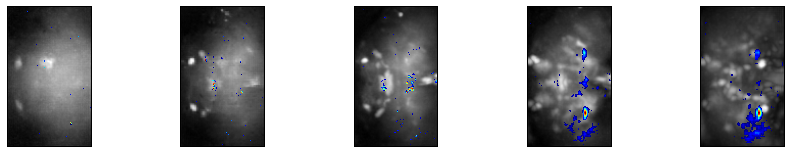

('left:', 0.058009033857636345, 'right:', 0.12542015938441928, 'walk:', 0.0013992602686540706)
0.255299730069
VGlut-F-200253
VGlut-F-300025
TH-F-100105
TH-M-000026


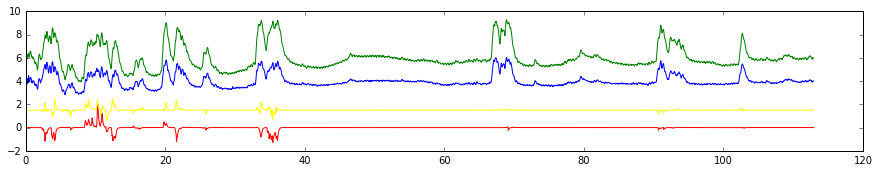

a
7
PB


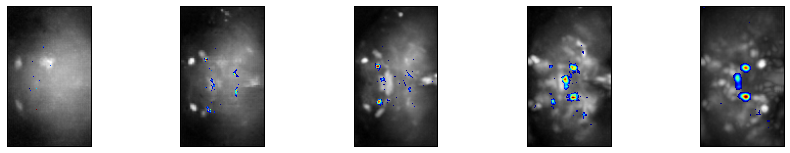

('left:', 0.077985120928890372, 'right:', 0.12712642008577163, 'walk:', -0.01537287564251319)
0.386546402164
TH-F-000048
TH-M-000034
TH-F-000048
TH-M-000034


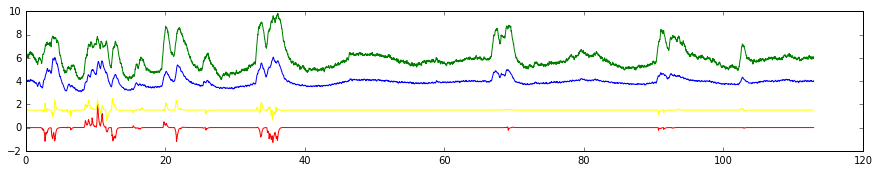

a
8
IPS_L


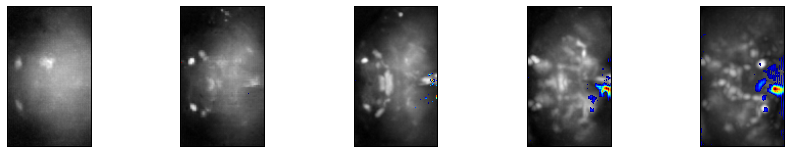

('left:', -0.0068103529792690959, 'right:', -0.040010601197456988, 'walk:', 0.0055623367163062862)
0.0304017674636
Tdc2-F-000042
Tdc2-F-000026
TH-M-200069
TH-M-300039


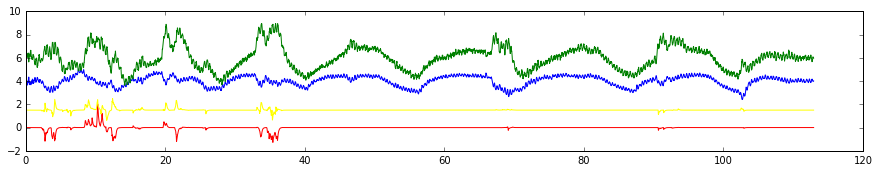


9
GNG


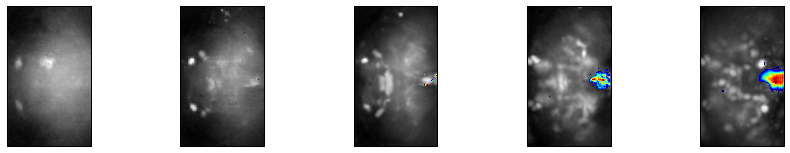

('left:', 0.015905670957440124, 'right:', 0.021352543770703201, 'walk:', 0.00055013034174170722)
0.0139741512888
TH-F-000004
TH-M-000007
TH-F-000004
TH-M-000007


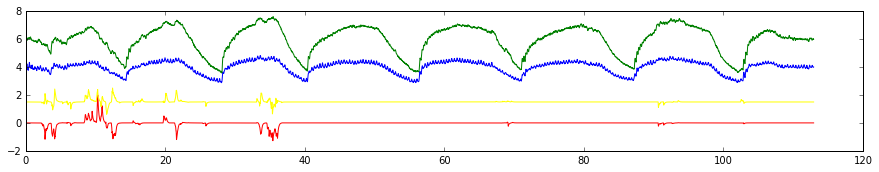


10
SLP_R


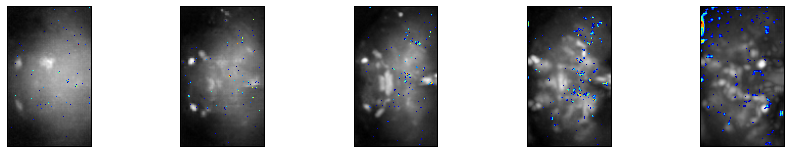

('left:', 0.055106977440781246, 'right:', 0.096966248257680507, 'walk:', -0.00049761644164827978)
0.25964368007
TH-F-000012
VGlut-F-200143
TH-F-000012
TH-M-000030


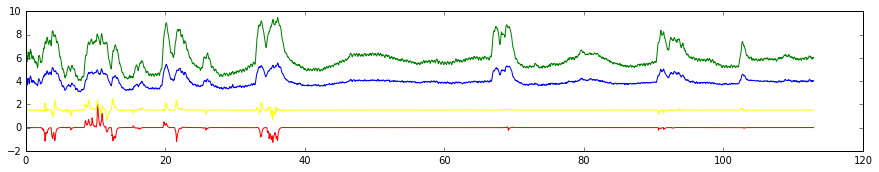


11
LO_R


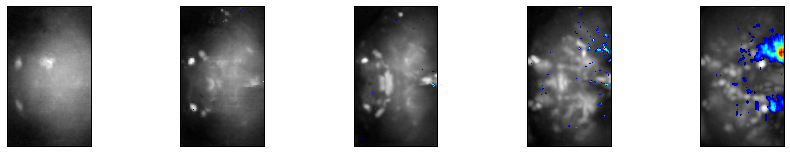

('left:', 0.028682758061235106, 'right:', 0.047911465338530364, 'walk:', 0.003595066863226401)
0.0691592493179
TH-F-300078
TH-F-100105
TH-F-300078
TH-F-100105


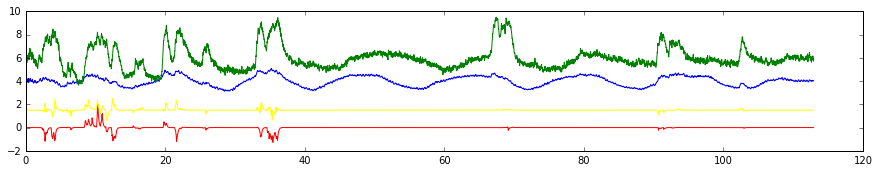


12
PLP_L


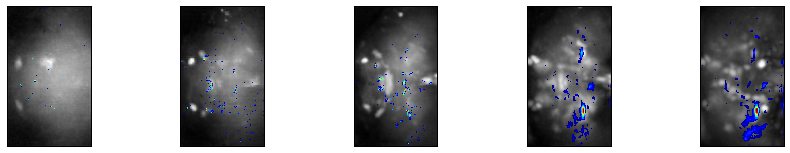

('left:', 0.054256183962368164, 'right:', 0.084798272840820171, 'walk:', 0.0026252312745380368)
0.266065218031
VGlut-F-100031
VGlut-F-900065
TH-M-000042
TH-F-000064


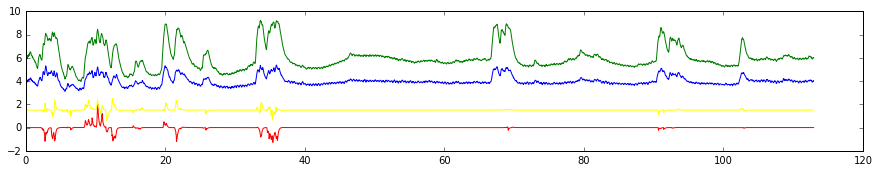

a
13
PLP_L


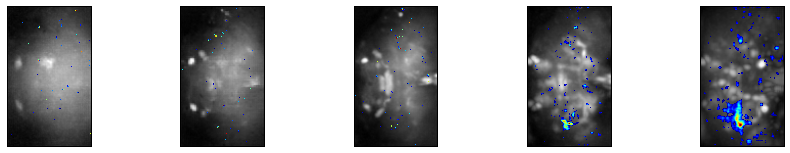

('left:', 0.038799139123426231, 'right:', 0.084020601588031818, 'walk:', 0.004319619951174955)
0.230804962931
TH-M-000042
VGlut-F-100031
TH-M-000042
TH-M-000013


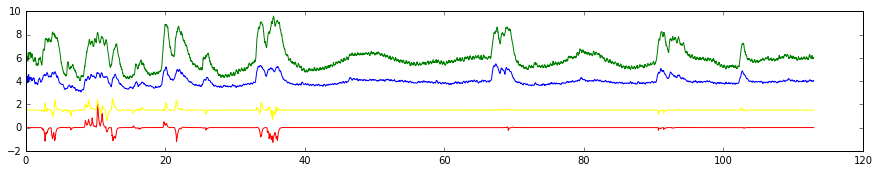

a
14
ICL_R


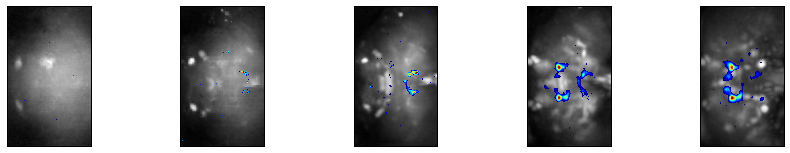

('left:', 0.043078526035964577, 'right:', 0.084436398206755373, 'walk:', -0.0063357385795452664)
0.240626553369
TH-F-100005
VGlut-F-000187
TH-F-100005
TH-F-000079


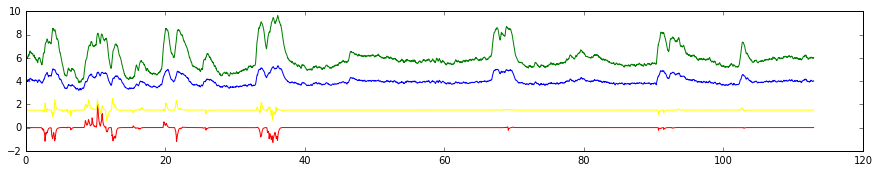

a
15
SLP_R


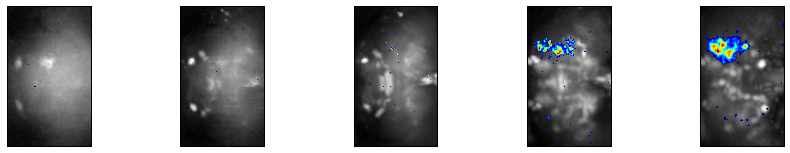

('left:', 0.03433791474576061, 'right:', 0.077659399051918709, 'walk:', -0.0049561887239412544)
0.200451222284
TH-M-000030
TH-F-000012
TH-M-000030
TH-F-000012


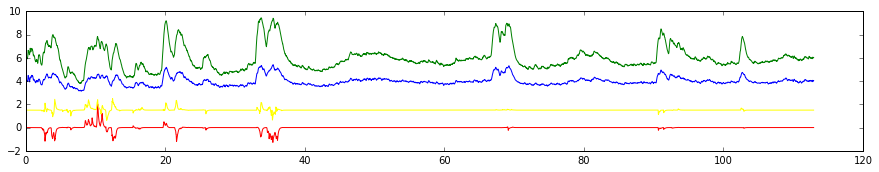

a
16
PB


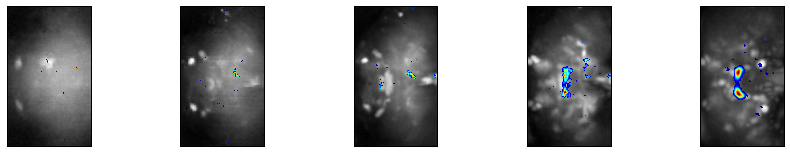

('left:', 0.051742547392955487, 'right:', 0.099041448954259731, 'walk:', -0.015999103965051525)
0.344336829261
TH-F-000048
TH-M-000034
TH-F-000048
TH-M-000034


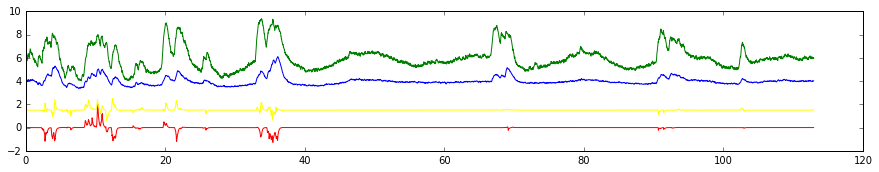

a
17
SPS_R


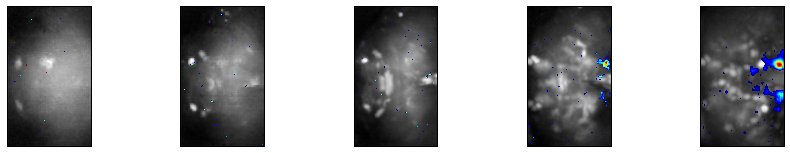

('left:', 0.016833509310199019, 'right:', 0.0088386429659070842, 'walk:', 0.0043920034304640691)
0.0137079842848
Tdc2-F-000027
VGlut-F-200049
TH-F-100005
TH-F-300004


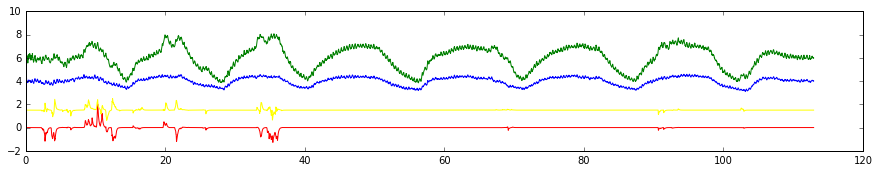


18
EB


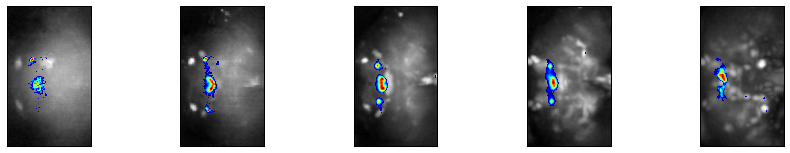

('left:', 0.044789119163442019, 'right:', 0.10075712545097609, 'walk:', -0.0089641727166293317)
0.366085821202
TH-M-100057
TH-F-200023
TH-M-100057
TH-F-200023


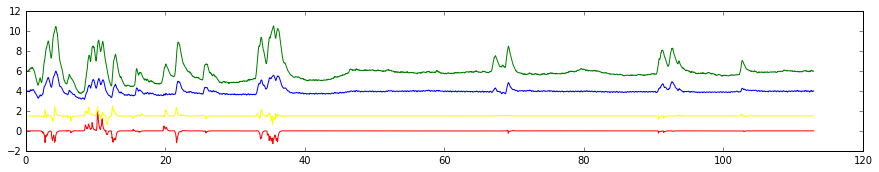

a
19
SMP_R


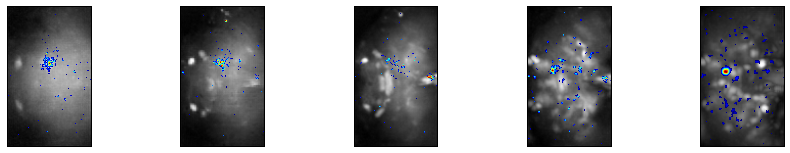

('left:', 0.026142017191290095, 'right:', 0.09535874914422858, 'walk:', -0.0068525128855061179)
0.312106247155
TH-M-000049
TH-F-000019
TH-M-000049
TH-F-000019


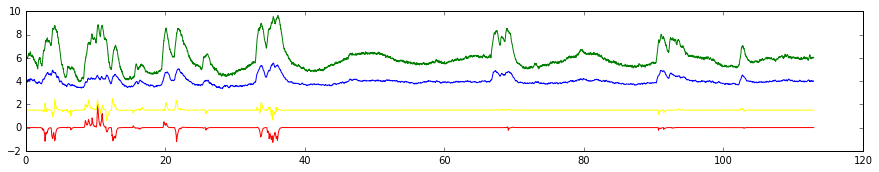

a
20
SPS_L


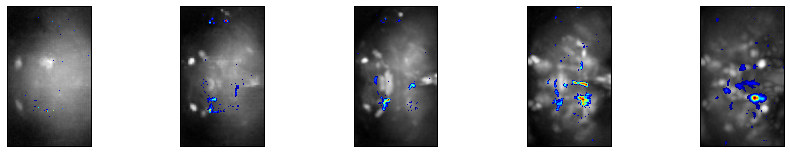

('left:', 0.063915726700102468, 'right:', 0.070928707534283181, 'walk:', -0.010729922032488973)
0.280174167496
fru-F-100015
TH-F-200020
TH-F-200020
TH-M-100077


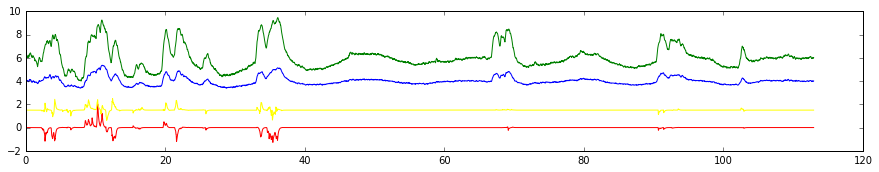

a
21
GNG


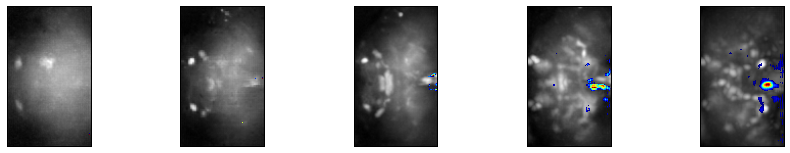

('left:', 0.003956912329876632, 'right:', -0.0018238667210343203, 'walk:', 0.0048243819895939007)
0.00190268516566
TH-F-000004
TH-M-000007
TH-F-000004
TH-M-000007


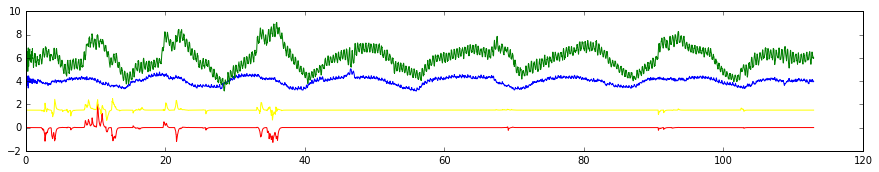


22
LH_R


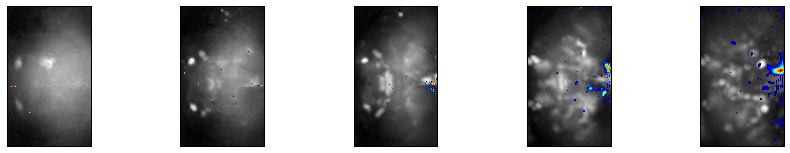

('left:', 0.0010722190955697096, 'right:', -0.013861133674040488, 'walk:', 0.005082646065931961)
0.00696582175722
TH-M-000030
TH-F-300078
TH-M-000030
TH-F-300078


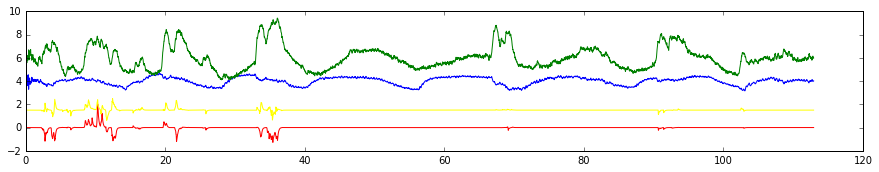


23
SPS_R


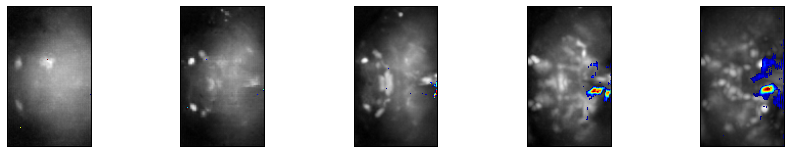

('left:', 0.012853540526523873, 'right:', -0.0016028580325810633, 'walk:', 0.0033368837050961209)
0.00754453178243
Tdc2-F-000027
Tdc2-F-000024
TH-F-300072
TH-F-100005


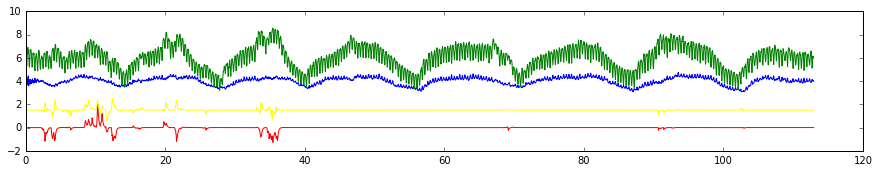


24
FB


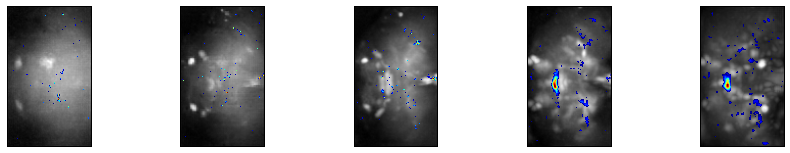

('left:', 0.040262886318946721, 'right:', 0.064897247551270271, 'walk:', -0.0029224894134432522)
0.239972818837
VGlut-F-000067
TH-F-300019
TH-F-300019
TH-M-100050


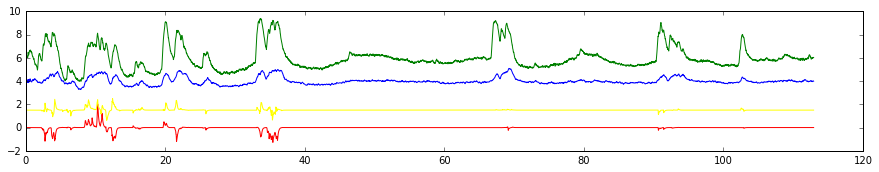

a
25
SPS_R


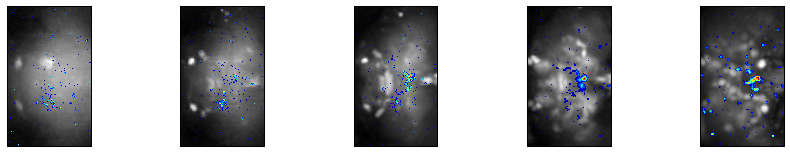

('left:', 0.041438953976708798, 'right:', 0.069421488641231682, 'walk:', 0.00017129394467774173)
0.27905980151
VGlut-F-400077
VGlut-F-200049
TH-F-100005
TH-M-000026


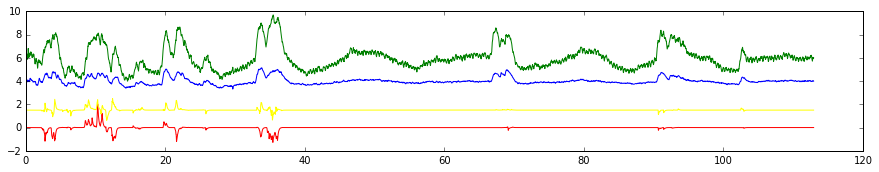


26
SPS_R


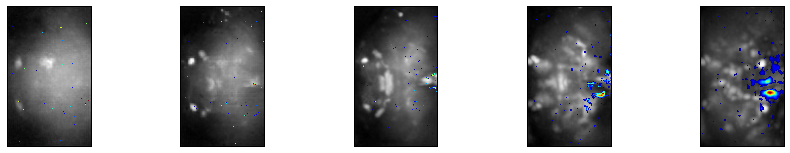

('left:', 0.018370236232288523, 'right:', 0.0053724795121697548, 'walk:', 0.00093034534943233806)
0.0163898671854
5-HT1B-F-100000
Tdc2-F-000042
TH-F-100005
TH-F-100105


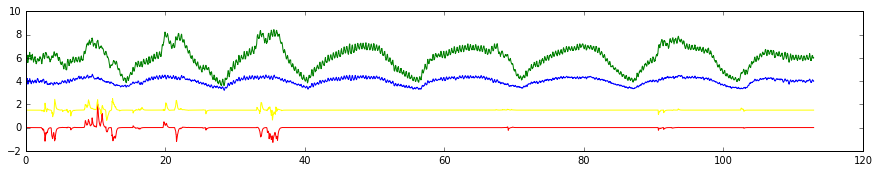


27
SPS_L


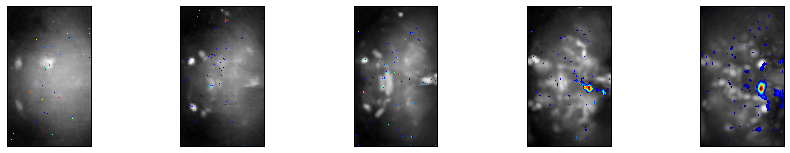

('left:', 0.034835348726725189, 'right:', 0.060761106592016181, 'walk:', 0.003030931718499906)
0.223442252296
fru-F-100015
5-HT1B-F-100000
TH-F-200020
TH-M-100077


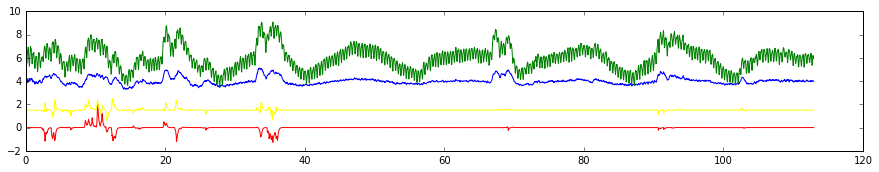


28
GNG


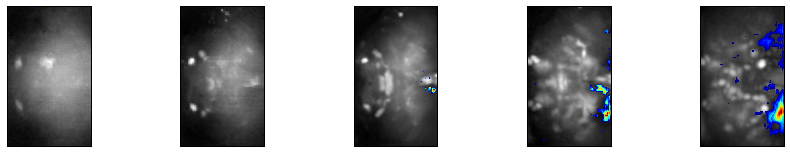

('left:', -0.012697754547264203, 'right:', -0.042104149415192429, 'walk:', 0.0032514119257163812)
0.0864323321748
TH-F-000004
TH-M-000007
TH-F-000004
TH-M-000007


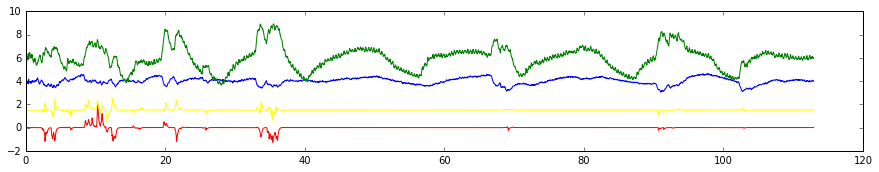


29
SPS_L


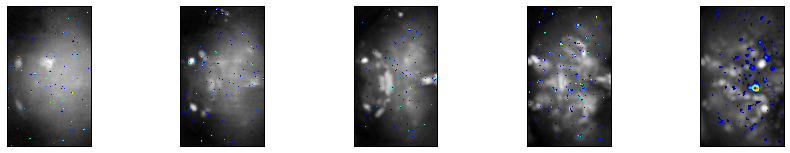

('left:', 0.031171862022700978, 'right:', 0.054594814692684748, 'walk:', 0.00043843862432593056)
0.224983170085
VGlut-F-000071
VGlut-F-900065
TH-F-200020
TH-F-100005


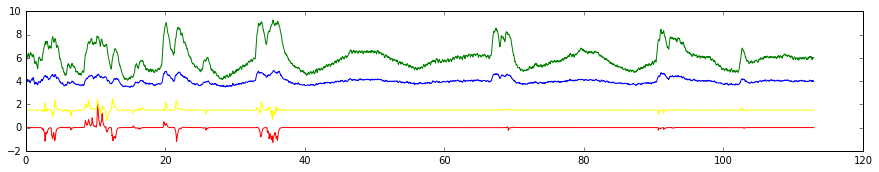


30
IB_R


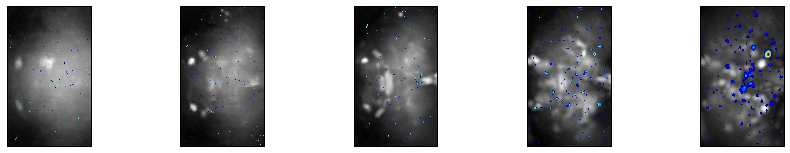

('left:', 0.024754542702041436, 'right:', 0.044462670817331303, 'walk:', 0.001577050965579814)
0.156557436784
VGlut-F-400077
VGlut-F-400264
TH-M-000048
TH-F-300078


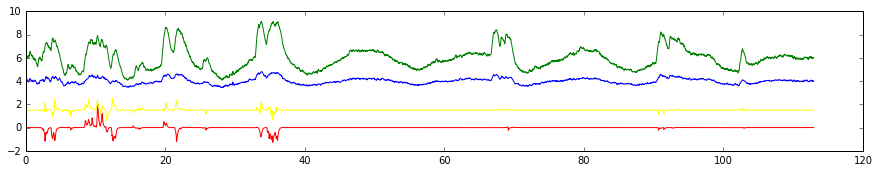


31
SMP_R


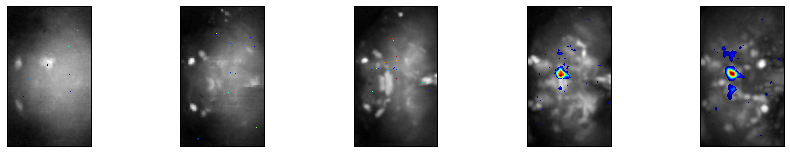

('left:', 0.019873198606298974, 'right:', 0.060190779288800601, 'walk:', -0.006720207390276095)
0.242391999469
TH-M-000049
VGlut-F-100188
TH-M-000049
TH-F-000019


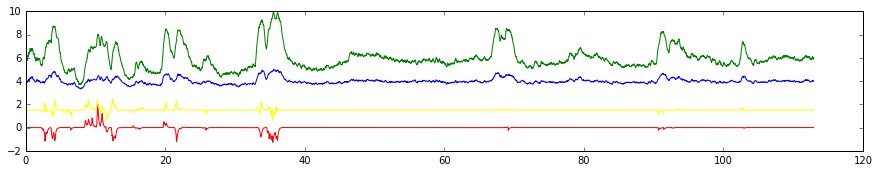

a
32
SMP_L


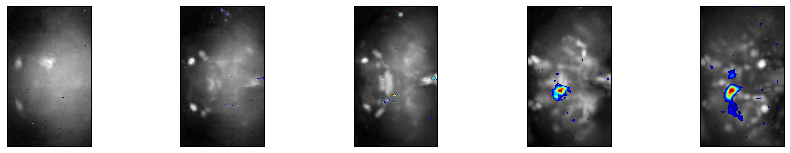

('left:', 0.030843372323647505, 'right:', 0.045278865158092291, 'walk:', -0.0054513326672411544)
0.206229055479
TH-F-000053
VGlut-F-000077
TH-F-000053
TH-F-200092


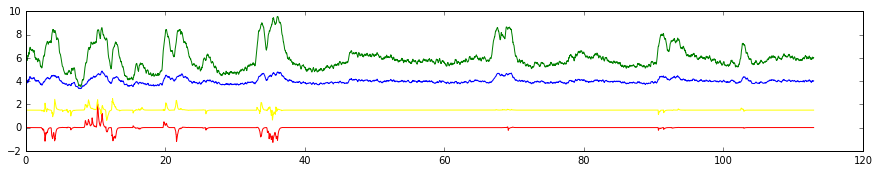

a
33
PLP_R


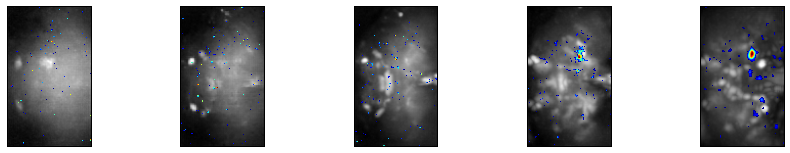

('left:', 0.022849889438037015, 'right:', 0.046277537242736352, 'walk:', -0.0038026227747111549)
0.193268778943
TH-F-100105
VGlut-F-100092
TH-F-100105
TH-F-100005


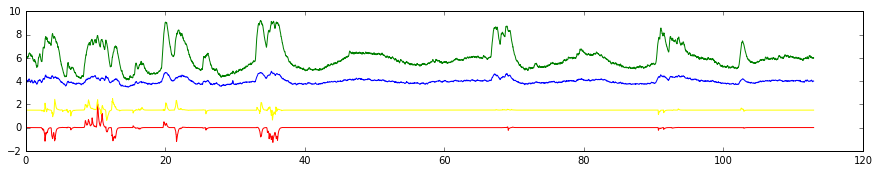


34
FB


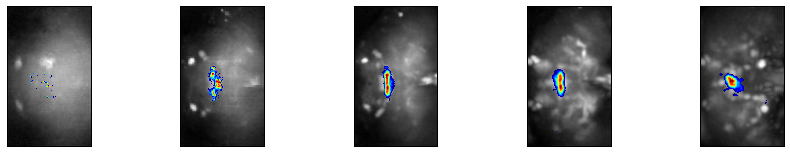

('left:', 0.024098428511873628, 'right:', 0.050715975064165378, 'walk:', -0.0059933913742219319)
0.229635117959
VGlut-F-000067
TH-F-300019
TH-F-300019
TH-F-200104


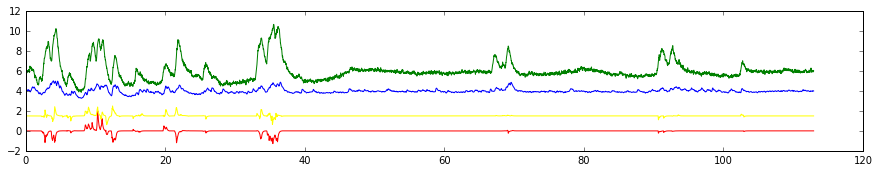

a
35
SPS_R


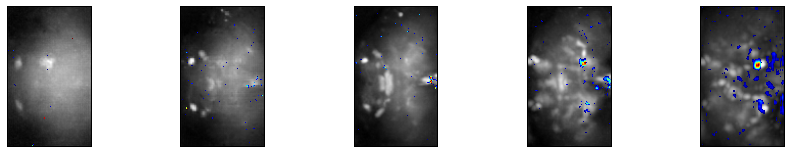

('left:', 0.0083288278133032689, 'right:', 0.017759573808206627, 'walk:', 0.00091611111429475839)
0.0321812134246
Tdc2-F-000027
VGlut-F-200049
TH-F-100005
TH-F-000079


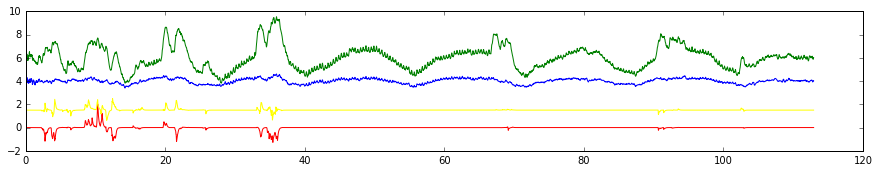


36
IB_R


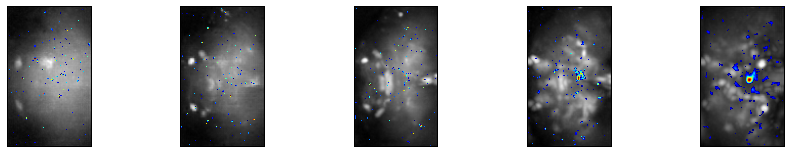

('left:', 0.019968174460241024, 'right:', 0.045332692673613381, 'walk:', -0.0010548031740833935)
0.197275609608
VGlut-F-400077
VGlut-F-400264
TH-F-100005
TH-F-300078


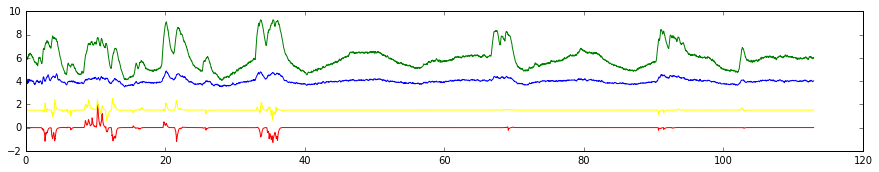


37
LAL_R


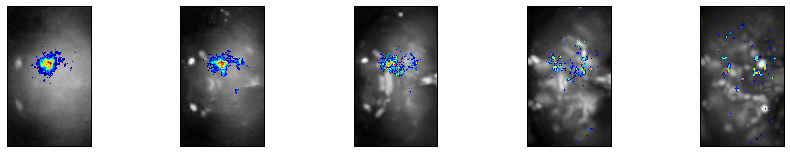

('left:', -0.0063937038751998351, 'right:', 0.074055578892703866, 'walk:', -0.0083383126491159976)
0.459920363628
VGlut-F-000297
TH-M-000040
TH-M-000040
TH-F-300062


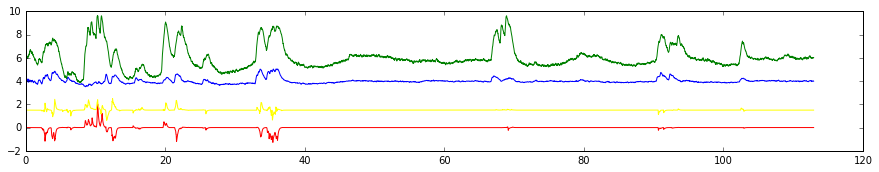

a
38
SPS_R


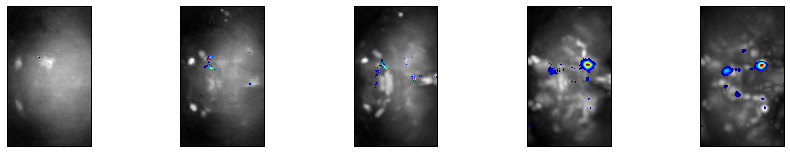

('left:', 0.0030680879874518908, 'right:', 0.043436494895081924, 'walk:', -0.012216966913632263)
0.17269466497
Tdc2-F-000027
VGlut-F-200049
TH-F-100005
TH-F-200113


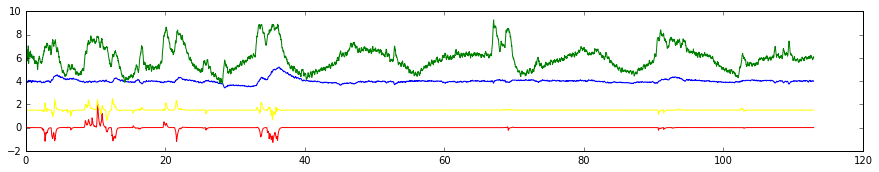

a
39
SPS_R


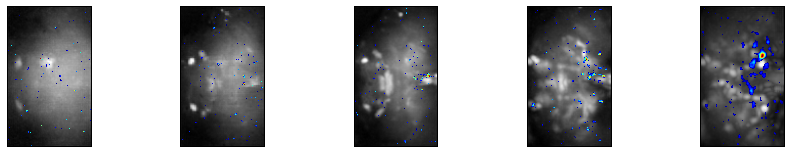

('left:', 0.016157704004255421, 'right:', 0.033186745739877156, 'walk:', 1.2987157721987275e-05)
0.129819066149
Tdc2-F-000027
VGlut-F-200049
TH-F-100005
TH-F-300004


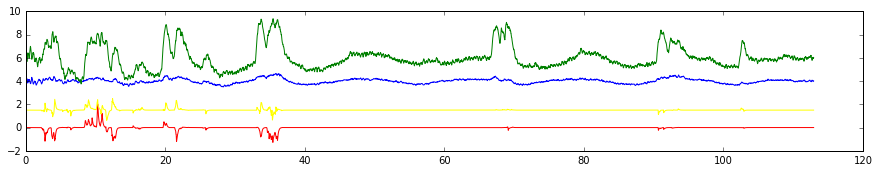


40
SLP_L


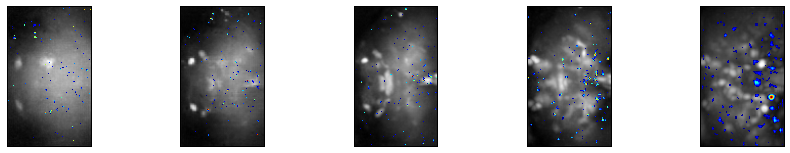

('left:', 0.014704395000670202, 'right:', 0.027507358937915883, 'walk:', 0.0036677173382070397)
0.122708705373
Tdc2-F-000027
TH-F-100005
TH-F-100005
TH-M-000013


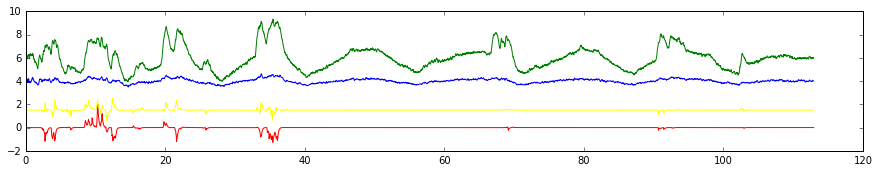


41
SMP_L


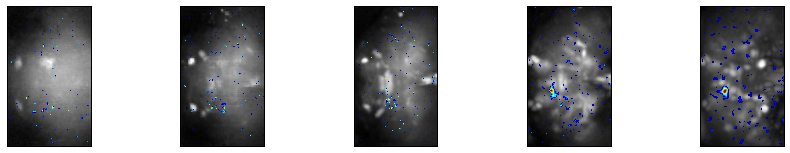

('left:', 0.031134433513191555, 'right:', 0.032321507476565592, 'walk:', -0.0037397632263651143)
0.228114436663
TH-F-000053
VGlut-F-000077
TH-F-000053
TH-F-200092


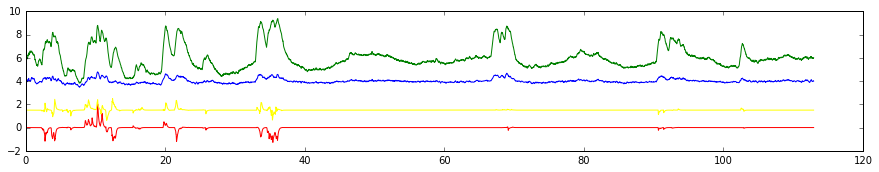

a
42
MB_VL_L


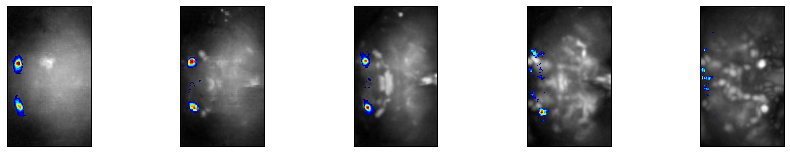

('left:', -0.020696053560672348, 'right:', -0.014741709938771727, 'walk:', -0.004283767269034084)
0.0940382662298
Trh-M-200082
Trh-M-200129
TH-M-100075
TH-F-300008


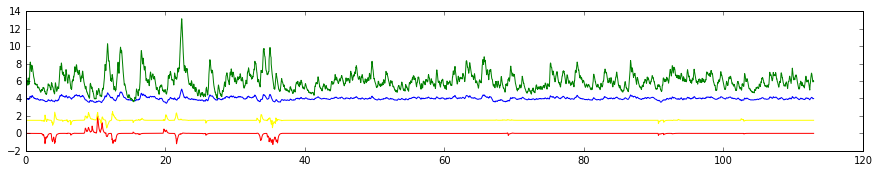

a
43
SPS_L


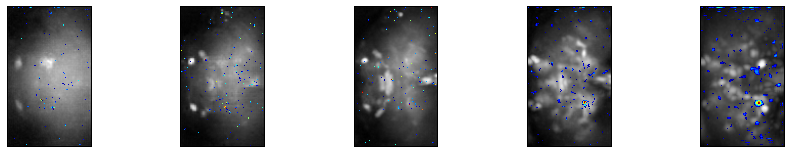

('left:', 0.015922720948538253, 'right:', 0.036147728924494936, 'walk:', 0.0036969730668724582)
0.215432618667
5-HT1B-F-100000
Tdc2-F-000042
TH-F-200020
TH-M-000059


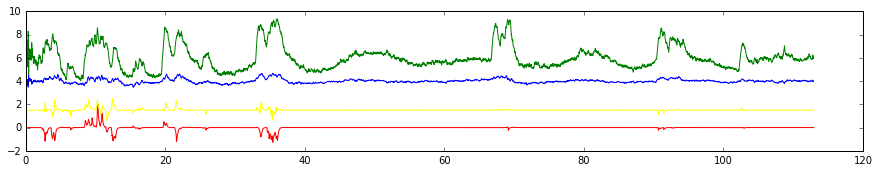


44
SIP_R


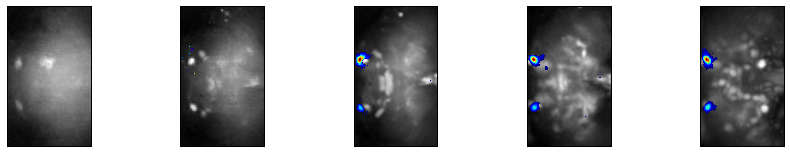

('left:', -0.019953035327431104, 'right:', -0.017149707906236815, 'walk:', 0.0017260846152288671)
0.0951942874436
TH-M-300011
TH-F-100099
TH-M-300011
TH-F-100099


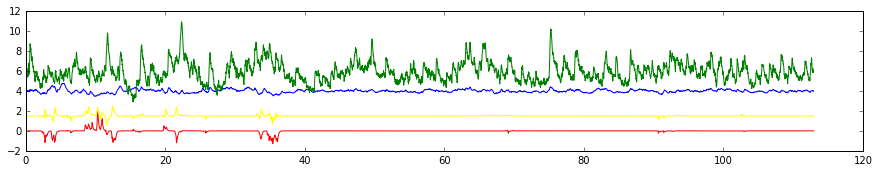

a
45
SPS_R


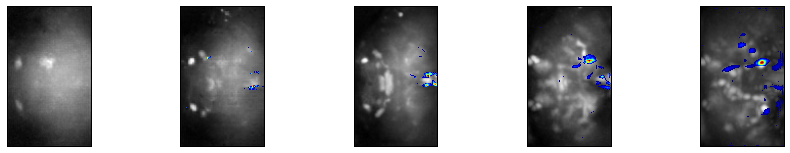

('left:', 0.018165273635637965, 'right:', 0.009521870416614505, 'walk:', 0.0013376074228989131)
0.0687784942322
Tdc2-F-000027
Tdc2-F-000024
TH-F-100005
TH-F-200113


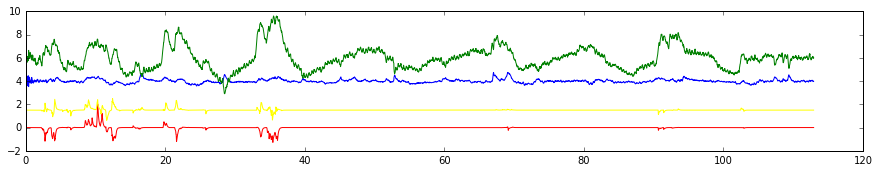


46
MB_VL_R


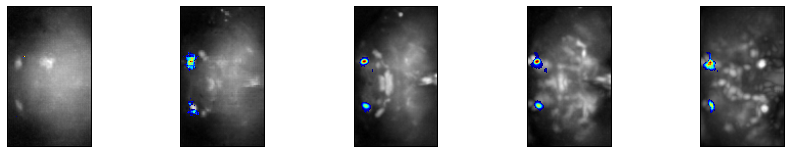

('left:', -0.016175572753139422, 'right:', -0.01751109466957225, 'walk:', 0.00033964425832588505)
0.0874654913083
TH-M-300011
Trh-M-200082
TH-M-300011
TH-F-100099


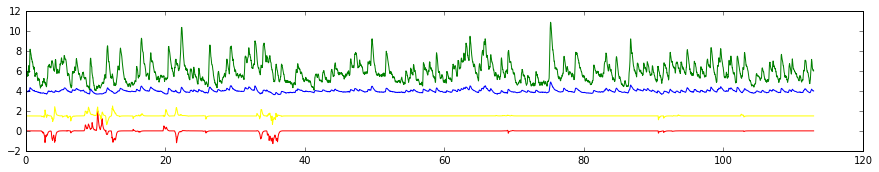

a
47
IPS_R


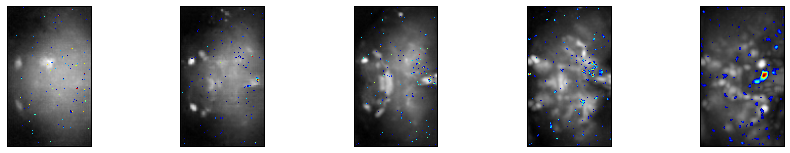

('left:', 0.014826082718002094, 'right:', 0.032656470599536268, 'walk:', -0.0012171572249175533)
0.205937075123
Tdc2-F-000027
Tdc2-F-000024
TH-M-800000
TH-F-300072


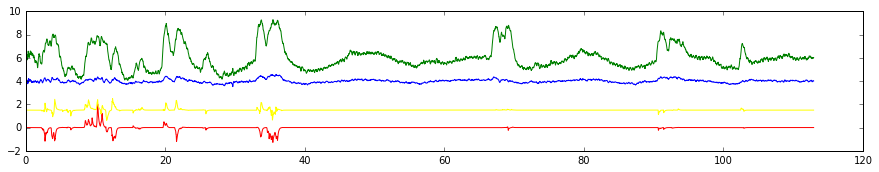


48
SPS_R


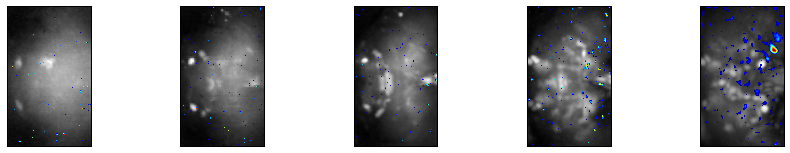

('left:', 0.0026214417616741508, 'right:', 0.0099504426205503666, 'walk:', 0.0026886854305214437)
0.022977855521
TH-F-100005
TH-F-100105
TH-F-100005
TH-F-100105


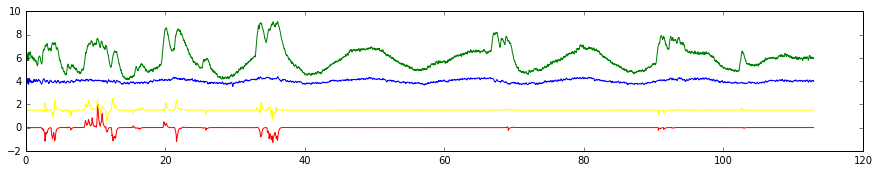


49
PLP_L


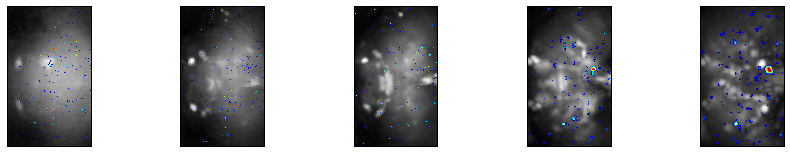

('left:', 0.011557244239833078, 'right:', 0.029229196348922428, 'walk:', 0.00022744487484487041)
0.183481629261
VGlut-F-100031
VGlut-F-200114
TH-M-000042
TH-F-000064


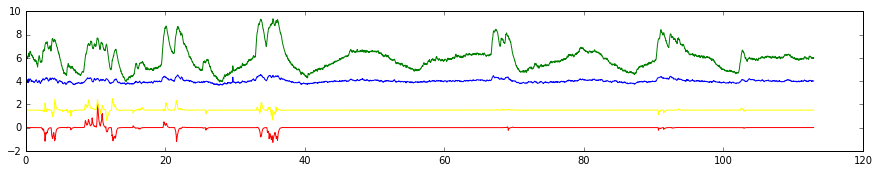


50
ME_R


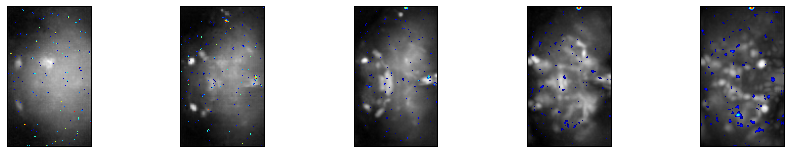

('left:', -0.020610377645244368, 'right:', -0.025374284387588587, 'walk:', 0.00182342062185048)
0.191418545106
Trh-M-700055
Trh-M-100072
TH-M-000042
TH-M-000013


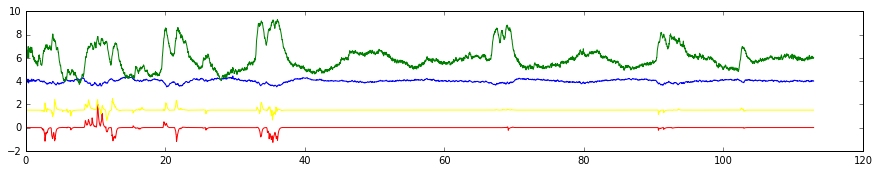


51
SMP_R


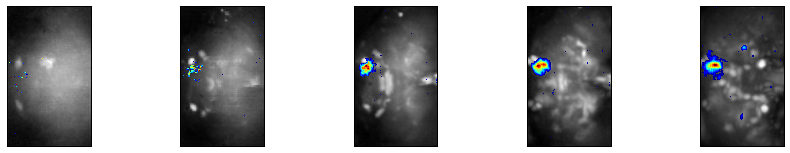

('left:', -0.017931624124519211, 'right:', -0.0040586974620810314, 'walk:', -0.0014181584719174445)
0.0771593842764
TH-F-000019
TH-M-000049
TH-F-000019
TH-M-000049


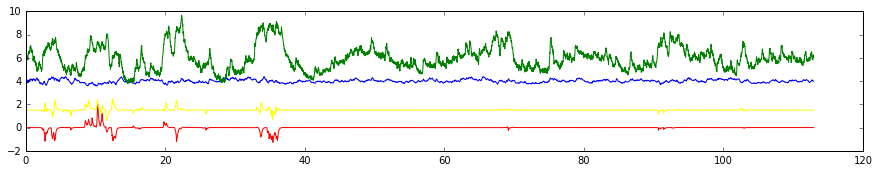

a
52
ME_R


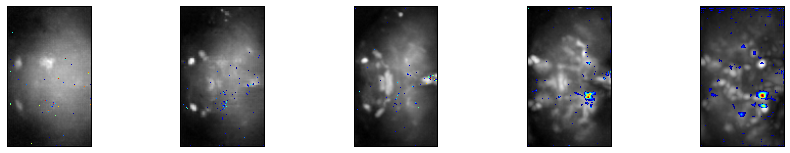

('left:', 0.01911798955130796, 'right:', 0.0040578761867161237, 'walk:', -0.001319497658408701)
0.0785784764329
Trh-M-700055
fru-F-100015
TH-F-200020
TH-M-000059


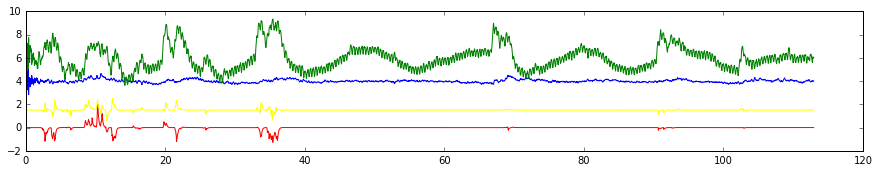


53
GNG


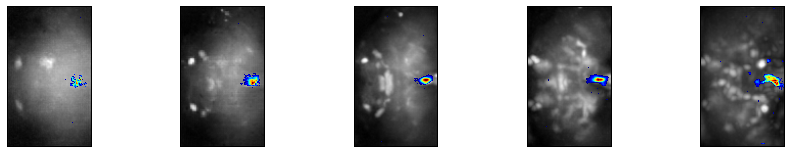

('left:', -0.0051096483205195116, 'right:', -0.018178647583417952, 'walk:', -0.00013489370464812508)
0.0764479877404
TH-F-000004
TH-M-000007
TH-F-000004
TH-M-000007


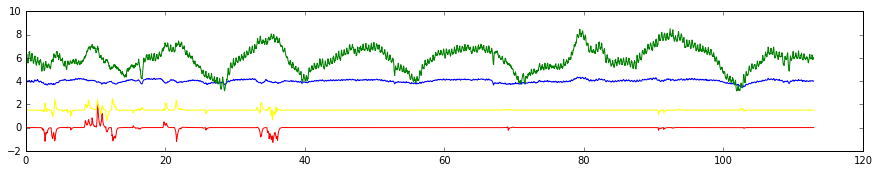


54
SCL_L


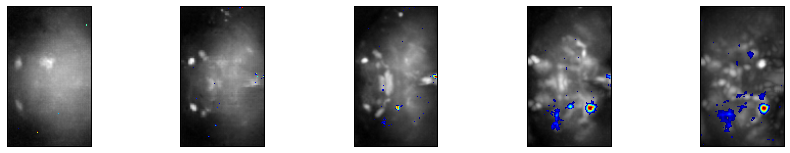

('left:', 0.0076168023925093659, 'right:', 0.013854682628009344, 'walk:', 0.0035469238040885948)
0.0673210521005
TH-M-000013
TH-M-000042
TH-M-000013
TH-M-000042


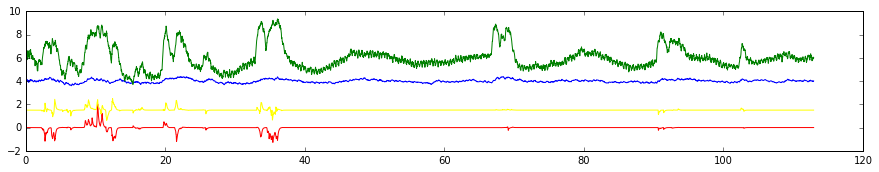

a
55
MB_VL_R


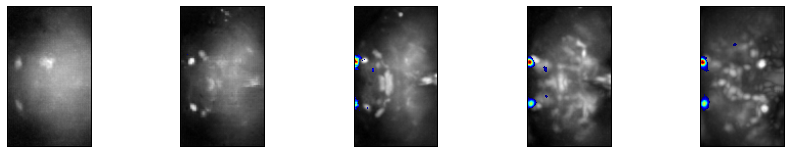

('left:', -0.0098356237734454482, 'right:', -0.014057119475635749, 'walk:', 0.0004510657479095178)
0.0687649027577
Trh-M-200082
Trh-M-200129
TH-M-300011
TH-F-200010


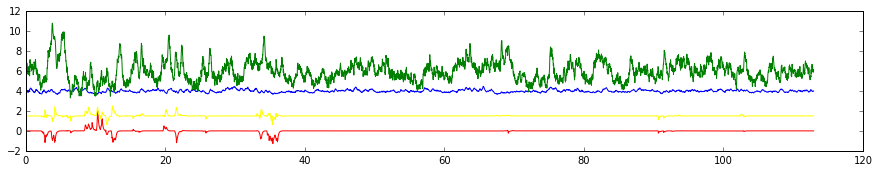

a
56
FB


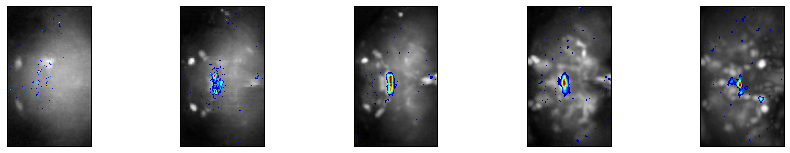

('left:', -0.012087530808904593, 'right:', -0.0069152785848956714, 'walk:', -0.0028620334288666956)
0.0586152894414
VGlut-F-000067
TH-F-300019
TH-F-300019
TH-F-200104


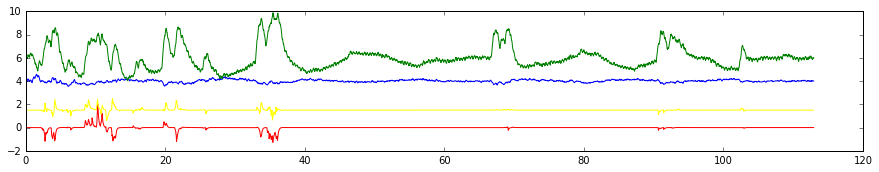

a
57
SCL_L


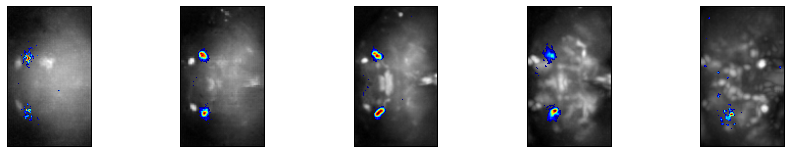

('left:', -0.014235872474060631, 'right:', -0.019028436930541535, 'walk:', -0.00037073608308100039)
0.146235012469
VGlut-F-000081
Trh-M-200082
TH-M-000042
TH-F-200035


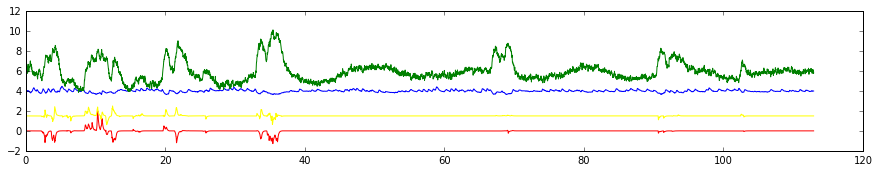

a
58
SPS_R


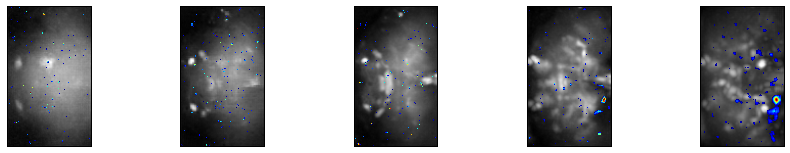

('left:', 0.010755586215627425, 'right:', 0.0028856247858177805, 'walk:', 0.0022888745727353316)
0.0401560828996
5-HT1B-F-100000
TH-F-100005
TH-F-100005
TH-F-000079


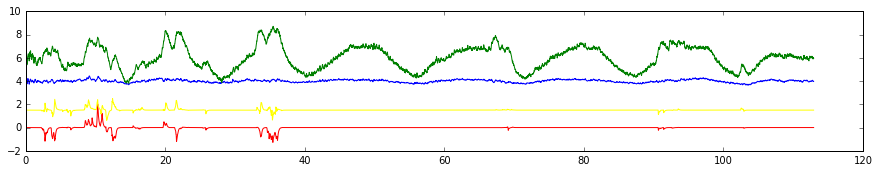


59
SMP_R


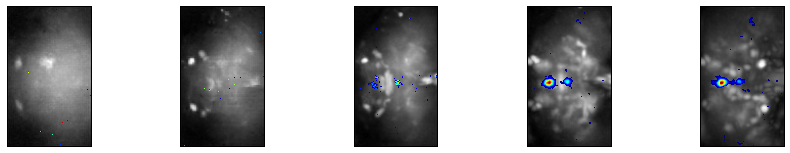

('left:', 0.014737322456080179, 'right:', 0.028099429514827426, 'walk:', -0.0040925265604447453)
0.246745056755
TH-M-000049
TH-M-000038
TH-M-000049
TH-M-000038


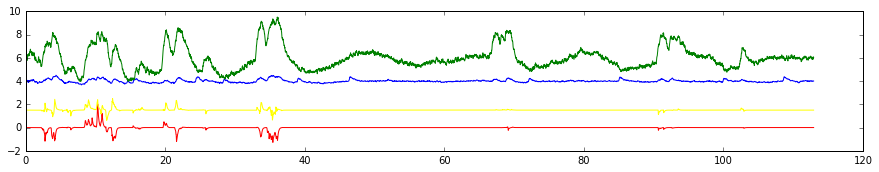

a
60
ME_R


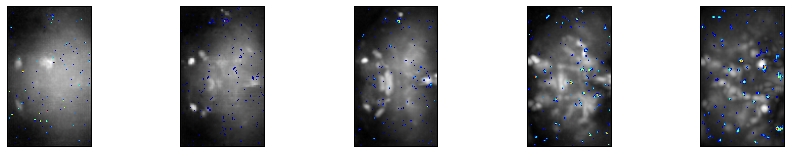

('left:', -0.012869181078454495, 'right:', -0.020710015834868516, 'walk:', -0.00024640563878624774)
0.173009649558
Trh-M-700055
Tdc2-F-200048
TH-F-100005
TH-F-000079


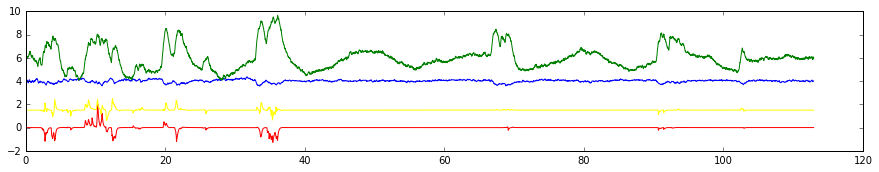


61
SMP_L


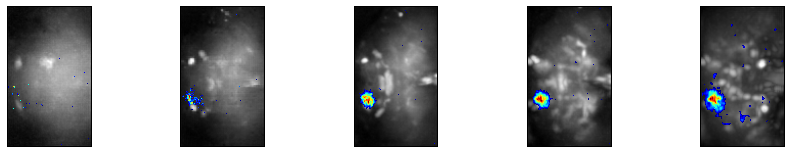

('left:', -0.0060014942427458777, 'right:', 0.0031211688371555564, 'walk:', -9.7084408225462868e-05)
0.0144034353713
TH-F-000053
TH-F-200092
TH-F-000053
TH-F-200092


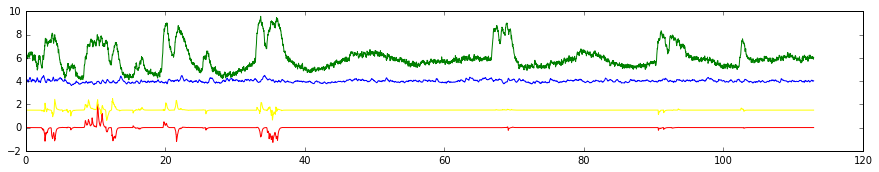

a
62
PLP_R


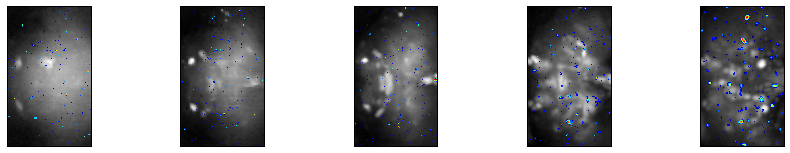

('left:', 0.0080976847109268564, 'right:', 0.02077726459277458, 'walk:', -0.0027651587186379861)
0.151294434144
TH-F-100105
VGlut-F-100092
TH-F-100105
TH-F-100005


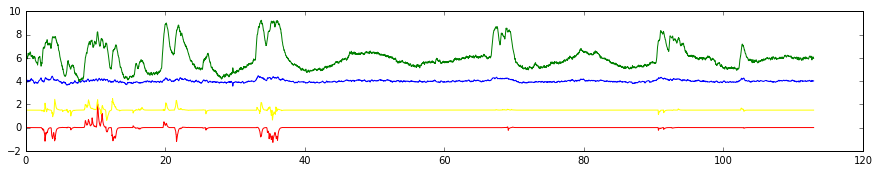


63
SMP_L


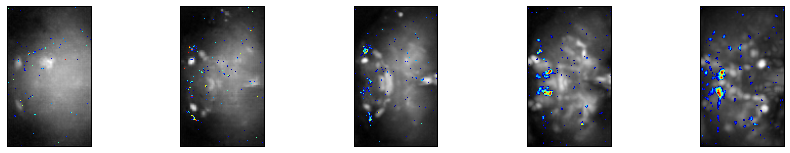

('left:', 0.0074689591929016337, 'right:', 0.020425126557815684, 'walk:', -0.0029106006216192241)
0.160580447921
TH-F-000053
TH-M-000049
TH-F-000053
TH-M-000049


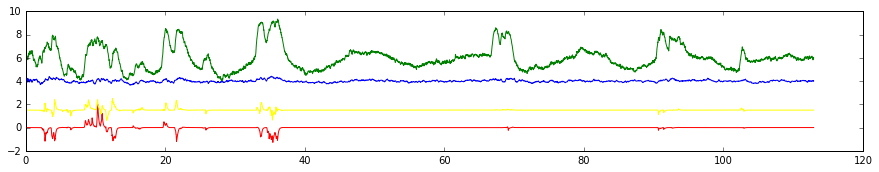

a
64
SMP_L


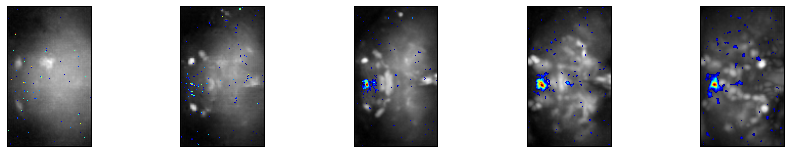

('left:', -0.011011966833753361, 'right:', -0.010493377524517331, 'walk:', -0.0029991390682411294)
0.103435194793
TH-F-000053
TH-M-000049
TH-F-000053
TH-M-000049


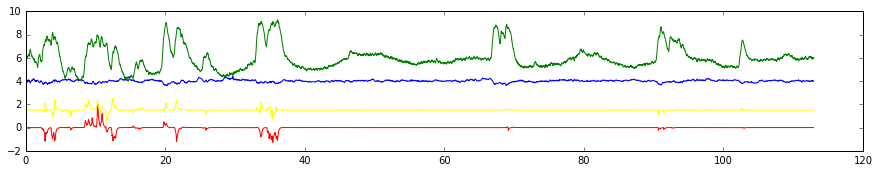

a
65
ME_R


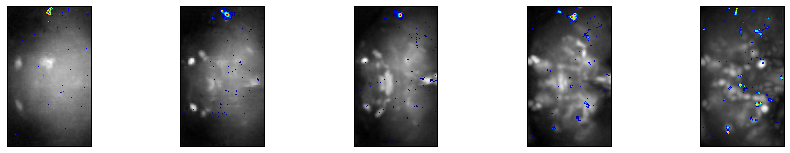

('left:', 0.010519410012162004, 'right:', -0.016598578477409566, 'walk:', 0.0001011572286265458)
0.161006119365
Trh-M-700055
Trh-M-100072
TH-F-000032
TH-M-700000


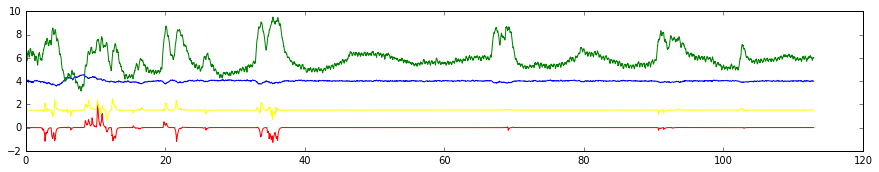


66
ME_R


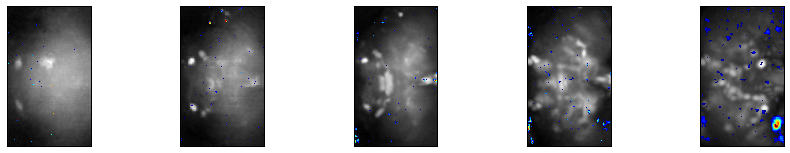

('left:', -0.0010878639038633343, 'right:', 0.0032286696996527029, 'walk:', -0.0014819206027594728)
0.0054933599444
Trh-M-700055
TH-M-000030
TH-M-000030
TH-F-000012


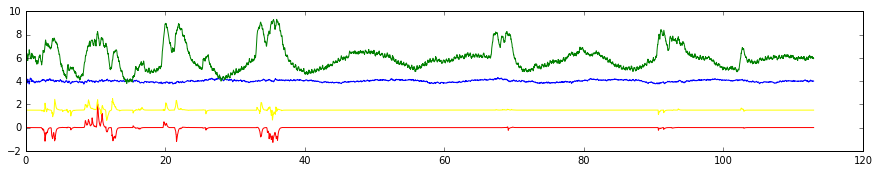


67
SMP_R


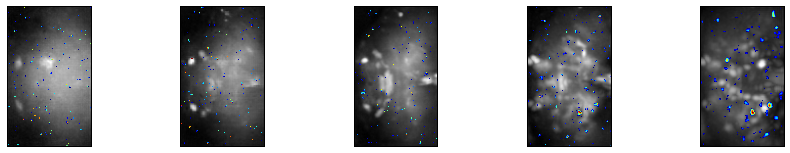

('left:', 0.0096494848134758074, 'right:', 0.013916618039861746, 'walk:', -0.00047495872243166586)
0.117375997319
TH-M-000049
TH-M-000038
TH-M-000049
TH-M-000038


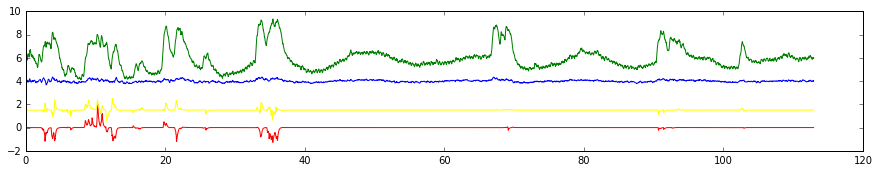


68
SMP_R


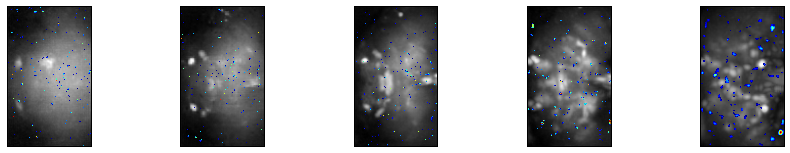

('left:', 0.007027479034845025, 'right:', 0.020329625204683757, 'walk:', 0.00086701104494082276)
0.201958723329
TH-M-000049
TH-F-000019
TH-M-000049
TH-F-000019


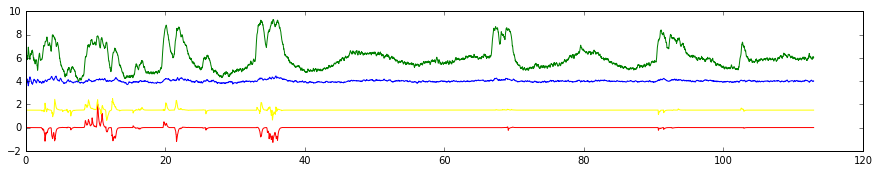


69
SMP_L


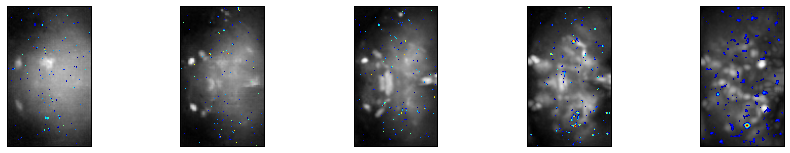

('left:', 0.0087734021371536439, 'right:', 0.015501935354945116, 'walk:', -0.00080450255885505979)
0.135801358142
TH-F-100105
VGlut-F-100092
TH-F-100105
TH-M-000013


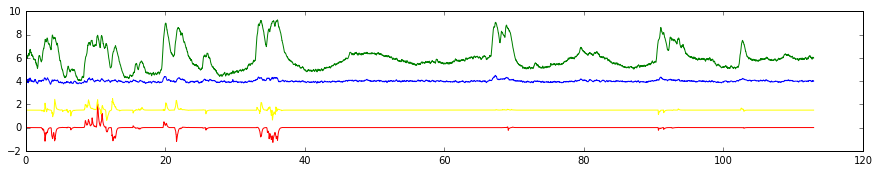


70
SPS_R


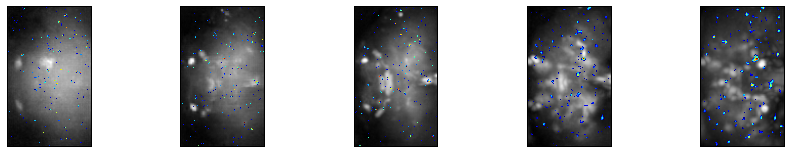

('left:', 0.0085524080563409589, 'right:', 0.014395618681547241, 'walk:', 0.002110609000393792)
0.138008335597
TH-F-100005
Tdc2-F-000027
TH-F-100005
TH-F-100105


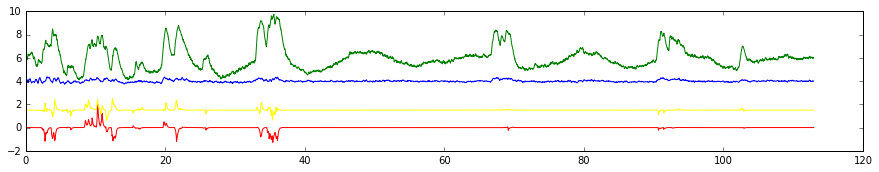


71
SPS_R


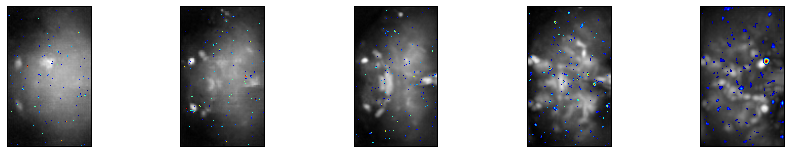

('left:', -0.00071731382002883121, 'right:', 0.0087549523548577403, 'walk:', -0.00075129719632387182)
0.0345138438066
Tdc2-F-000027
TH-F-100005
TH-F-100005
TH-F-300004


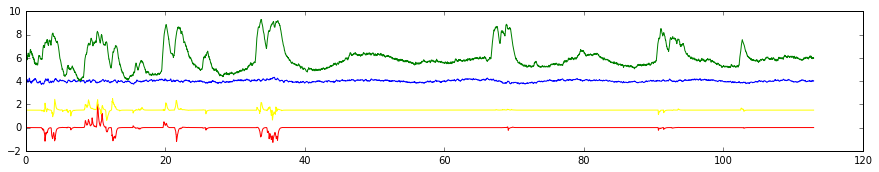


72
GNG


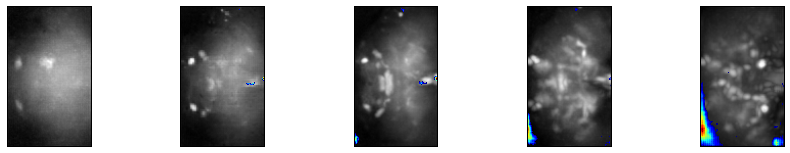

('left:', -0.0037865794219470693, 'right:', -0.00052496895070105673, 'walk:', -0.001295786725656254)
0.0097940166356
TH-F-000004
TH-M-000007
TH-F-000004
TH-M-000007


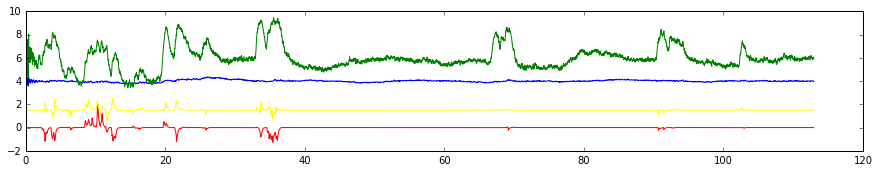


73
GNG


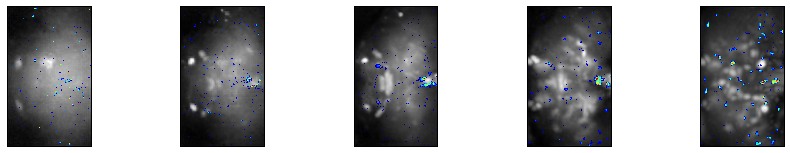

('left:', 0.0055974841925336893, 'right:', 0.017411301632847292, 'walk:', -0.0042208030573606427)
0.155150483914
TH-F-000004
TH-F-000013
TH-F-000004
TH-F-000013


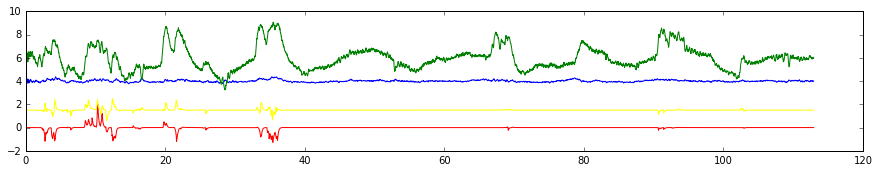


74
ICL_R


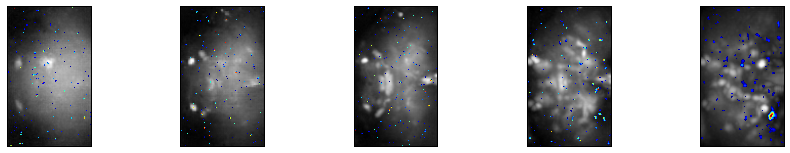

('left:', 0.005940803905483843, 'right:', 0.012115070947785966, 'walk:', 0.0011822663499426681)
0.103362016728
TH-F-100005
TH-F-000079
TH-F-100005
TH-F-000079


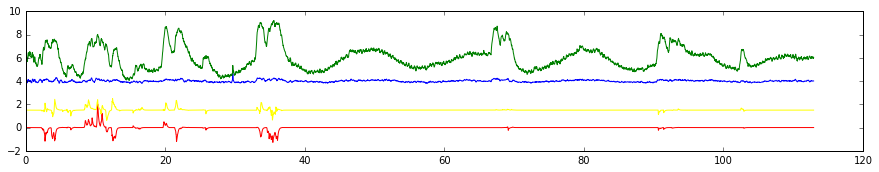


75
LO_L


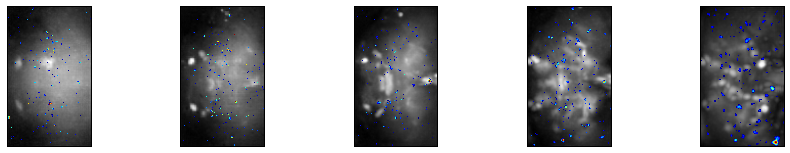

('left:', 0.008201199869129221, 'right:', 0.016018267510865821, 'walk:', -0.00027782622120642309)
0.177359927711
TH-F-100005
TH-F-000079
TH-F-100005
TH-F-000079


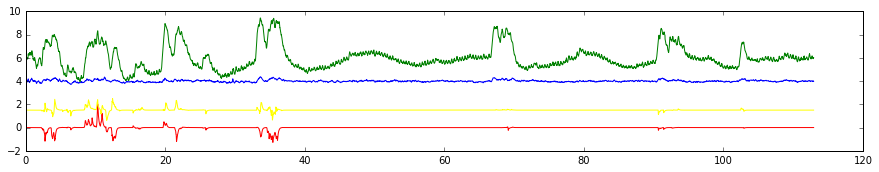


76
GNG


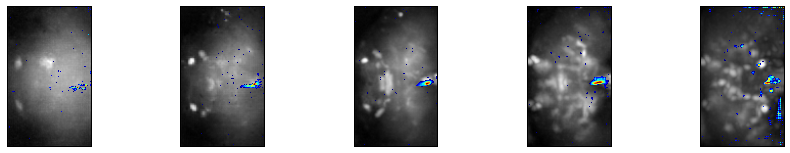

('left:', -0.00574542389176239, 'right:', -0.0027860363357976852, 'walk:', 0.0011469653152470769)
0.0201865992859
TH-F-000004
TH-M-000007
TH-F-000004
TH-M-000007


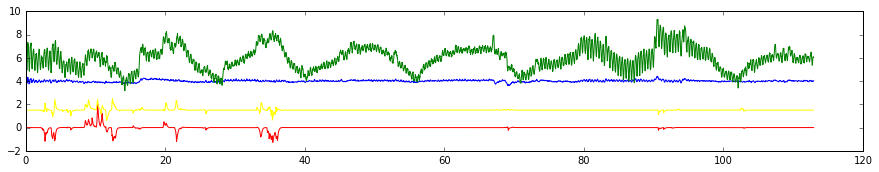


77
SMP_R


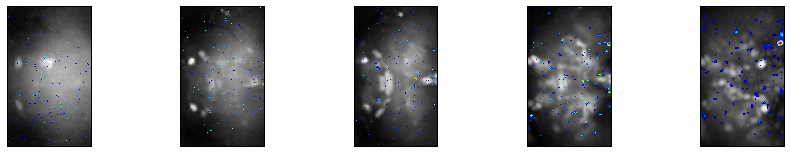

('left:', 0.00084423765586794, 'right:', -0.003128178749883451, 'walk:', -0.0010129443400671103)
0.00709276640671
TH-F-100105
5-HT1B-F-100000
TH-F-100105
TH-M-000030


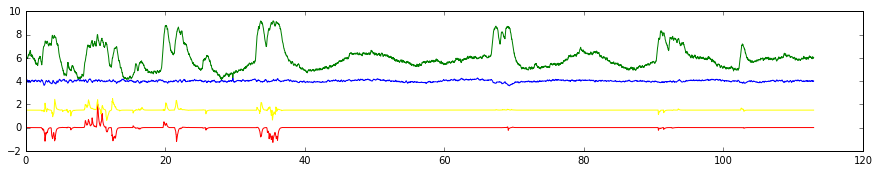


78
MB_VL_L


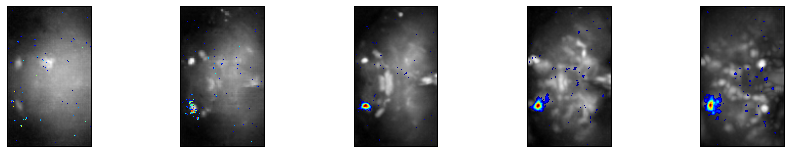

('left:', -0.0095998207767002321, 'right:', 0.00068067189871896241, 'walk:', 0.00359498165478185)
0.0471542559586
Trh-F-200023
TH-M-100075
TH-M-100075
TH-M-200014


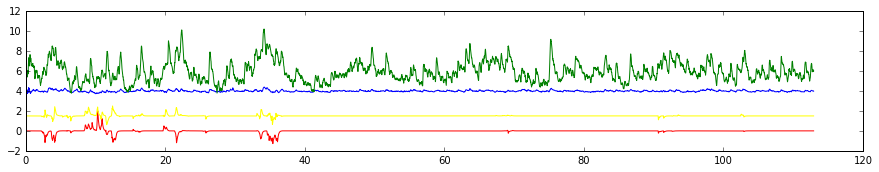

a
79
GNG


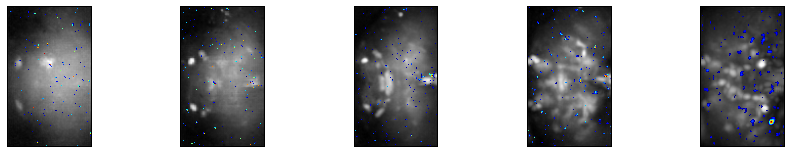

('left:', -0.0048677517484705893, 'right:', -0.0068341201610982857, 'walk:', 0.00026523967533329928)
0.0402875766248
TH-F-100005
TH-F-000004
TH-F-100005
TH-F-000004


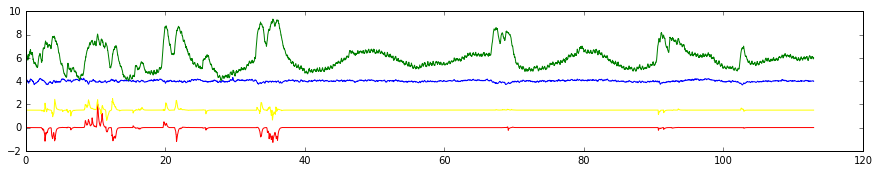


80
LO_R


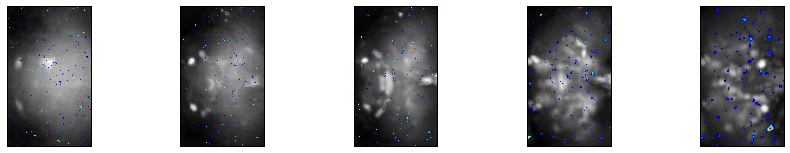

('left:', 0.0036476039968875488, 'right:', 0.014994463451330334, 'walk:', -0.0043012006560120535)
0.132889532178
TH-F-100005
VGlut-F-500422
TH-F-100005
TH-F-000079


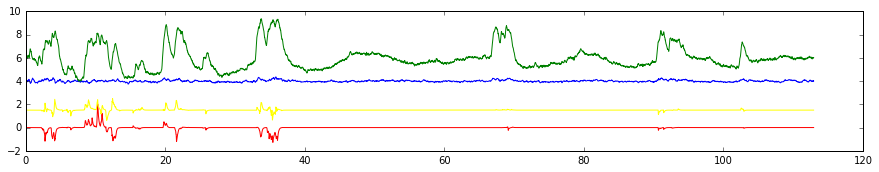


81
ICL_R


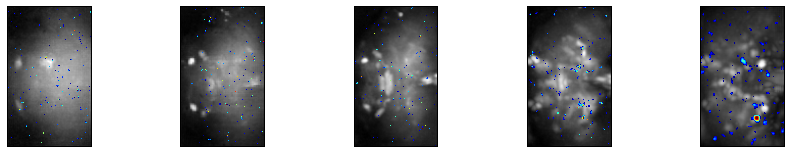

('left:', 0.0097077027185407255, 'right:', 0.01201874374535529, 'walk:', -0.0032338481937203255)
0.129288250987
TH-F-100005
TH-F-000079
TH-F-100005
TH-F-000079


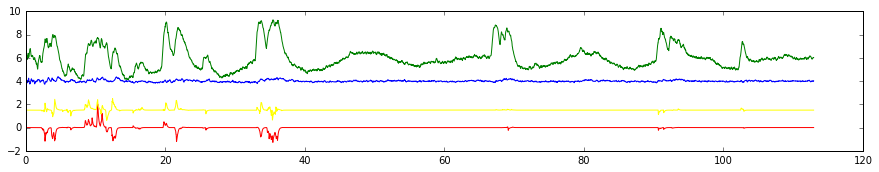


82
SLP_R


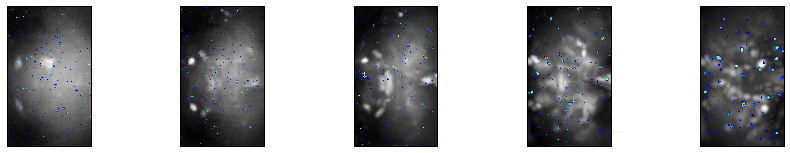

('left:', -0.0036508105960382886, 'right:', -0.0095577014666736928, 'walk:', -0.0019468438619926372)
0.0780840446758
VGlut-F-200062
TH-F-000012
TH-F-000012
TH-M-000030


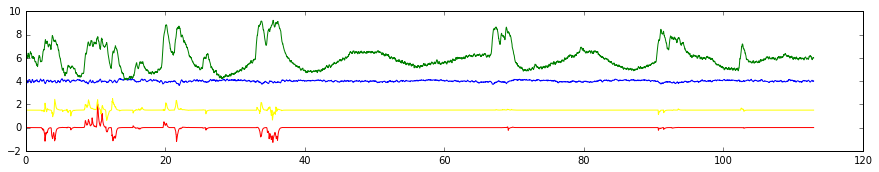


83
GNG


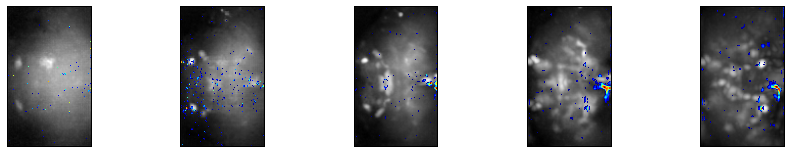

('left:', -0.0029145405721402212, 'right:', -0.010884751134405155, 'walk:', 0.003805802960240098)
0.0785910124516
5-HT1B-F-100000
Tdc2-F-000042
TH-F-000004
TH-F-200020


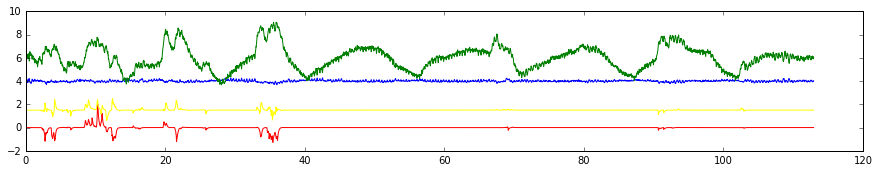


84
PLP_R


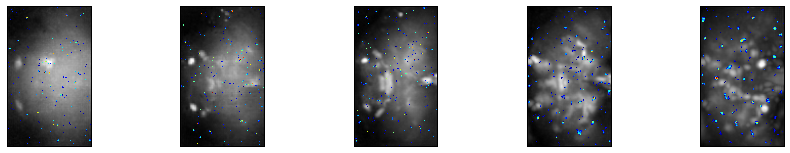

('left:', -0.0059323314119293855, 'right:', -0.0078813020368404593, 'walk:', -0.0068603752737447666)
0.133977929082
TH-F-100105
TH-F-100005
TH-F-100105
TH-F-100005


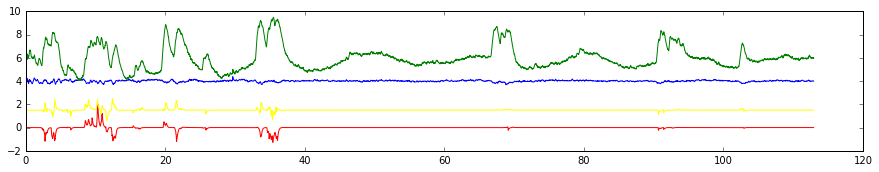


85
SPS_R


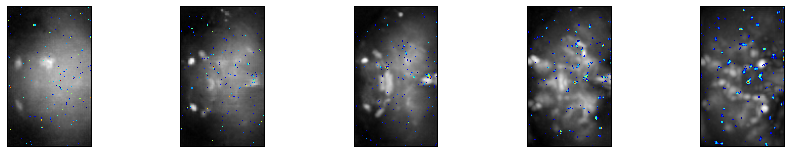

('left:', 0.00300679449766587, 'right:', 0.006824991074282573, 'walk:', -0.00049548929686567007)
0.0381947554302
fru-M-200266
VGlut-F-600404
fru-M-200266
Trh-F-500212


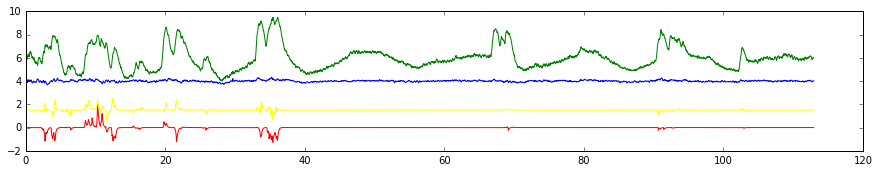


86
SMP_R


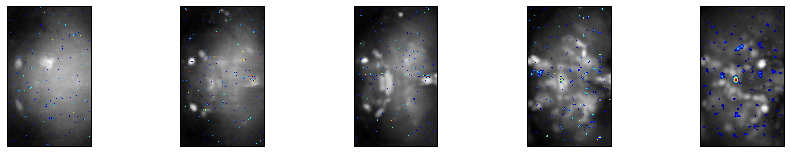

('left:', 0.0047703096529631154, 'right:', 0.0052823174202135314, 'walk:', -0.0018441130139414648)
0.0315109990283
TH-F-100105
TH-F-100005
TH-F-100105
TH-F-100005


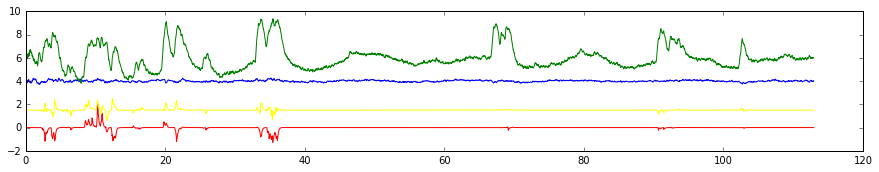


87
GNG


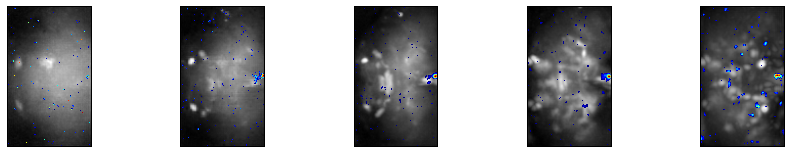

('left:', 0.0011419015629282625, 'right:', -0.012373458442100348, 'walk:', 0.0046285427163403683)
0.122142771719
TH-F-000004
TH-M-000007
TH-F-000004
TH-M-000007


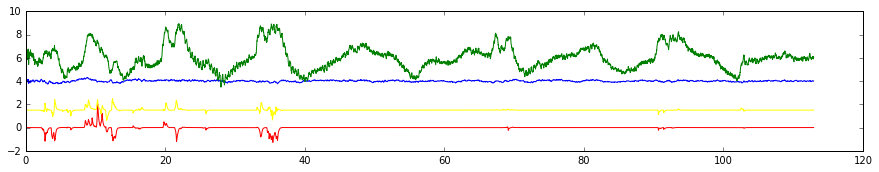


88
GNG


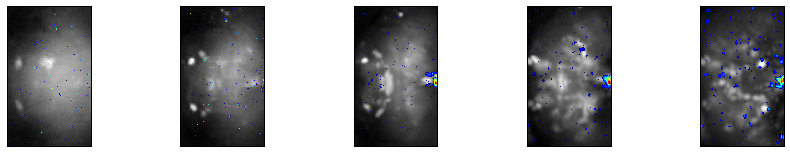

('left:', -0.0055916210519516823, 'right:', -0.0081300427021603963, 'walk:', -0.00030641938106531867)
0.0782316972652
TH-F-000004
TH-M-000049
TH-F-000004
TH-M-000049


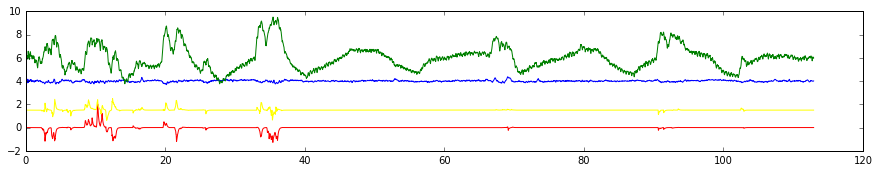


89
LH_L


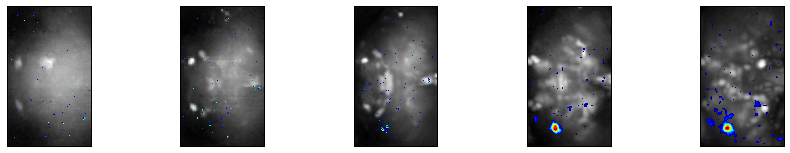

('left:', 0.0028563088869241462, 'right:', 0.0022871521898568596, 'walk:', -6.3471179734637603e-05)
0.0103257883796
TH-M-000013
Tdc2-F-400026
TH-M-000013
TH-M-000042


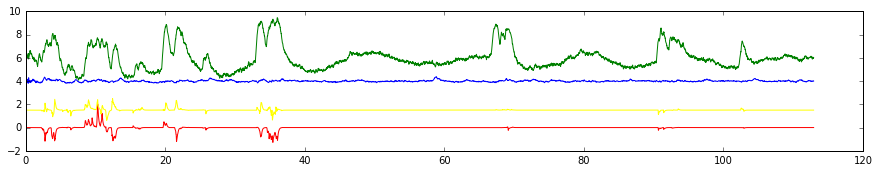


90
LO_R


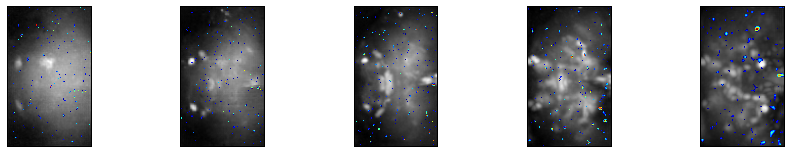

('left:', -0.004725531018378833, 'right:', -0.0067493858806019361, 'walk:', -0.0020658361823428888)
0.0692501156144
VGlut-F-500422
VGlut-F-300549
TH-M-000030
TH-F-100105


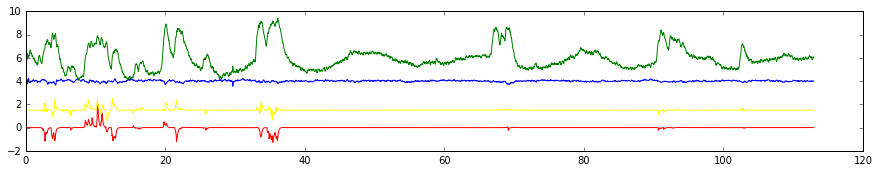


91
SMP_R


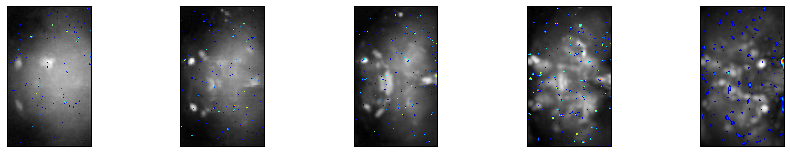

('left:', -0.0021255019801508716, 'right:', -0.0096883486144289082, 'walk:', 0.0027929108960601974)
0.0780534077137
TH-M-000049
TH-M-300011
TH-M-000049
TH-M-300011


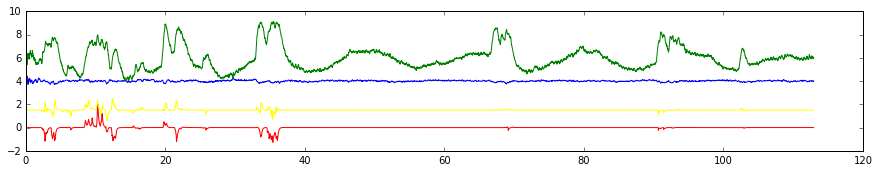


92
SMP_R


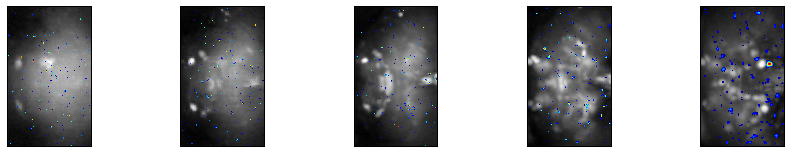

('left:', 0.0052958278818060964, 'right:', 0.0031528378396046383, 'walk:', -0.000604639599158427)
0.0326095586486
VGlut-F-200062
TH-M-000049
TH-M-000049
TH-M-300011


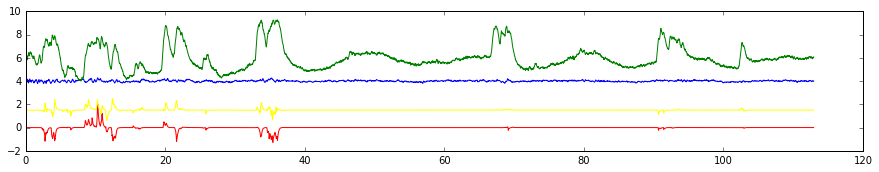


93
SMP_R


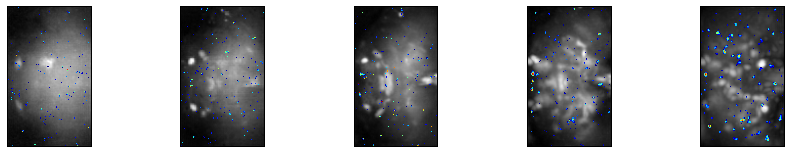

('left:', 0.0021696306245812822, 'right:', 0.0070937416606584643, 'walk:', 0.00060973769803661718)
0.0550154206994
TH-F-000012
TH-M-000030
TH-F-000012
TH-M-000030


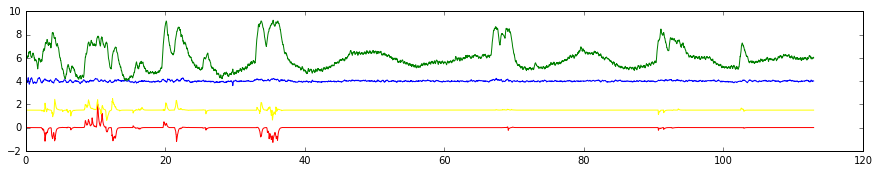


94
LO_R


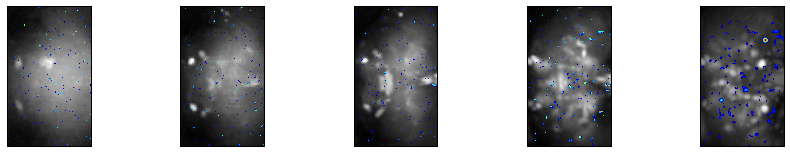

('left:', 0.00039716902578798194, 'right:', 0.0077468297303500419, 'walk:', -0.0011904624123353644)
0.0576715427805
VGlut-F-500422
VGlut-F-300549
TH-F-000053
TH-F-200092


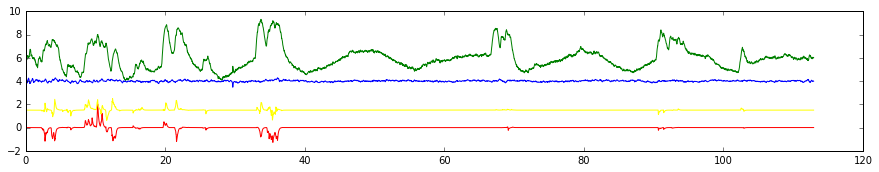


95
SLP_L


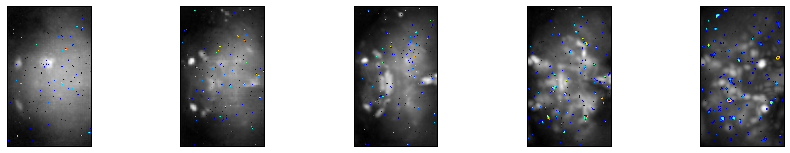

('left:', -0.0025540826538701968, 'right:', -0.0010333344601318132, 'walk:', -0.0011361853335204574)
0.0119979052987
Trh-F-200023
TH-M-000013
TH-M-000013
TH-M-000042


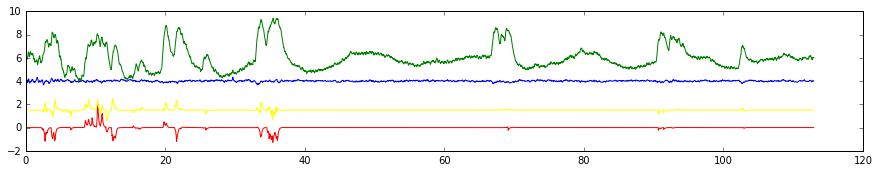


96
LH_R


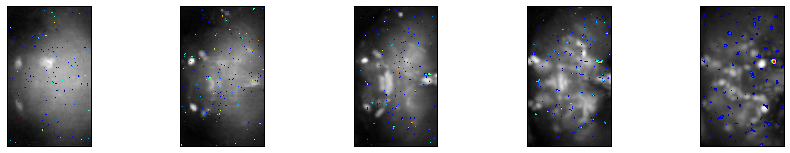

('left:', 0.0013803401820860505, 'right:', 0.0063165180213275371, 'walk:', 0.0014974803897068682)
0.0528963003229
TH-F-300078
TH-M-000030
TH-F-300078
TH-M-000030


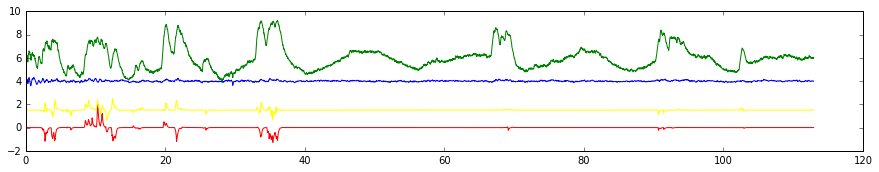


97
LH_L


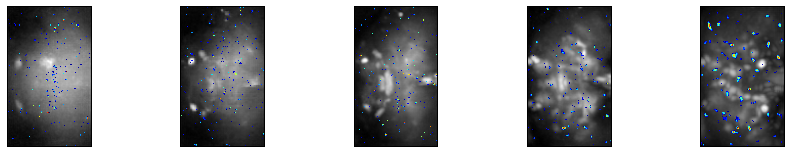

('left:', -0.00029035602698525753, 'right:', 0.0015295912871509647, 'walk:', 0.00091405464179884874)
0.00413235310749
TH-F-100105
TH-M-000013
TH-F-100105
TH-M-000013


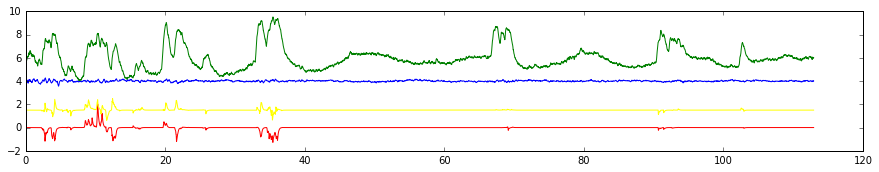


98
LO_R


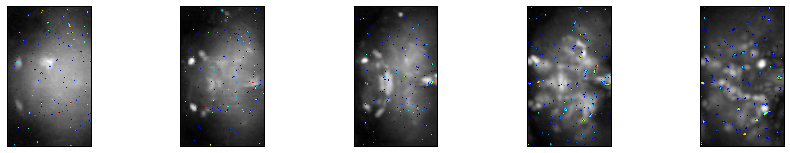

('left:', 0.0011441004240824147, 'right:', -0.00064533435981596675, 'walk:', -0.00041461848739346912)
0.00217806986818
TH-F-100105
Tdc2-F-000027
TH-F-100105
TH-F-300004


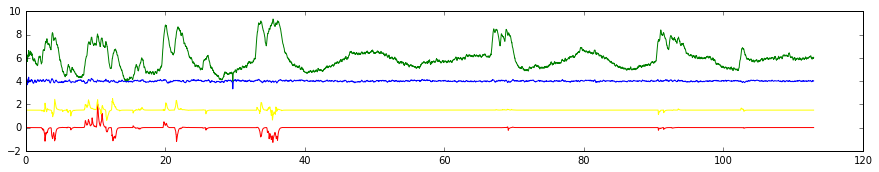

In [75]:
for j in range(S[3]):

    a=''
    if S[2]>5:
        for i in range(Nstack):
            V=Dmaps[:,:,Indices[i],j]
            D1[:,:,i]=np.max(V,2)
        D2[:,:,:,j]=D1
        D1[D1==0]=np.nan
           
    else:
        for i in range(S[2]):
            V=Dmaps[:,:,i,Order[j]]
            D1[:,:,i]=V 

    if (CompMainName[j] != ''):
        print(j)
        print(CompMainName[j])
        for i in range(Nstack):
            plt.subplot(1,5,i+1)
            plt.imshow(Dmean[:,:,i],cmap=plt.cm.gray)
            plt.imshow(D1[:,:,i], cmap=my_cmap,interpolation='none')
            frame1 = plt.gca()
            frame1.axes.get_xaxis().set_visible(False)
            frame1.axes.get_yaxis().set_visible(False)
        
        plt.show()
        
        model = algorithm.fit(X, DT[:,j])
        betas = model.coef_
        rsq = model.score(X,DT[:,j])
        print('left:',betas[0],'right:',betas[1],'walk:',betas[2])
        print(rsq)
        I=np.argsort(-Scores[:,j])        
            #print(I)
        #print(e[0][I])
        print(NeuronName[np.int(np.float(e[3][I[0]]))])
        print(NeuronName[np.int(np.float(e[3][I[1]]))])        
        ITH=np.argsort(-ScoresTH[:,j])
            #print(I)
        #print(e[0][ITH])
        print(NeuronName[np.int(np.float(e[3][ITH[0]]))])        
        print(NeuronName[np.int(np.float(e[3][ITH[1]]))]) 
        
        plt.plot(Time_fluoICA,2*DT[:,j]+4)
        plt.plot(Time_fluoICA,DTzmap[:,j]/np.std(DTzmap[:,j])+6)
        plt.plot(Time_fluoICA,2*(Xk[:,0]-Xk[:,1])/np.max(Xk[:,0]-Xk[:,1]),color=(1,0,0))   
        plt.plot(Time_fluoICA,Xk[:,2]/np.max(Xk[:,2])+1.5,color=(1,1,0))
        plt.show()
        a=raw_input()
    
    Label_ICs.append(a)


In [76]:
L=[j for j in range(len(Label_ICs)) if Label_ICs[j]=='a']

In [77]:
Good_ICs[L]=1

In [78]:
fn=open('/home/sophie/Desktop/100135GoodICs99.txt','w')
for i in range(S[3]):
    if Good_ICs[i]:
        print>>fn, i
        print>>fn, CompMainName[i]
        print>>fn, Good_ICs[i]

In [79]:
G=Good_ICs.tolist();

# Plot all components together

In [80]:
if S[2]>5:
    Final_map=np.zeros([S[0],S[1],5,3])
    Fmaps=np.zeros([S[0],S[1],5,3])
else:
    Final_map=np.zeros([S[0],S[1],3]) 
    Fmaps=np.zeros([S[0],S[1],3])    
C=np.zeros([S[3],3])

In [81]:
C1=np.zeros([6,3])
C1[0][:]=(1,0,0)
C1[1][:]=(0,1,0)
C1[2][:]=(0,0,1)
C1[3][:]=(0.8,0.8,0)
C1[4][:]=(0,1,1)
C1[5][:]=(1,0,1)
S1=DT.shape

In [82]:
GoodICo=Good_ICs[NewOrder]
D2o=D2[:,:,:,NewOrder]
datao=data[:,:,:,NewOrder]
Dmapso=Dmaps[:,:,:,NewOrder]
LargerRegionIo=LargerRegionI[NewOrder]
Ind=np.array(range(S[3]))
Indexo=Ind[NewOrder]
DTo=DT[:,NewOrder]

In [83]:
C=np.zeros((S[3],3))
i=0
for j in range(S[3]):  
    if LargerRegionIo[j]<12 and GoodICo[j]:
        C[j,:]=C1[i%6][:]
        for k in range(3):           
            M=np.max(np.squeeze(np.reshape(D2o[:,:,:,j],S[0]*S[1]*5)))
            Fmaps[:,:,:,k]=0.6*D2o[:,:,:,j]*C[j,k]/M
        Final_map=Final_map+Fmaps
        #print(Indexo[j])
        i=i+1

In [84]:
k=0
J=np.zeros(len(GoodICo[GoodICo==1]))
for j in range(len(GoodICo)):
    if GoodICo[j]:
        print(k)
        print([CompMainName[Indexo[j]]])
        J[k]=j
        k=k+1

0
['LO_L']
1
['LO_L']
2
['PLP_R']
3
['PLP_R']
4
['PLP_R']
5
['PLP_L']
6
['PLP_L']
7
['MB_VL_R']
8
['MB_VL_R']
9
['MB_VL_L']
10
['MB_VL_L']
11
['SMP_R']
12
['SMP_R']
13
['SMP_R']
14
['SMP_R']
15
['SMP_L']
16
['SMP_L']
17
['SMP_L']
18
['SMP_L']
19
['SMP_L']
20
['SIP_R']
21
['SLP_R']
22
['ICL_R']
23
['SCL_L']
24
['SCL_L']
25
['EB']
26
['PB']
27
['PB']
28
['FB']
29
['FB']
30
['FB']
31
['LAL_R']
32
['SPS_R']
33
['SPS_L']
34
['SPS_L']


In [108]:
Sets=[[0,1],[2,3,4,5,6],[7,8,9,10,20,24],[11,12,13,14,15,16,17,18,19],21,[22,23],25,[26,27],[28,29,30],31,[32,33,34]]

In [109]:
S=datao.shape

In [110]:
S

(138, 83, 26, 99)

In [111]:
for i in range(len(Sets)):
    
    Final_map3=np.zeros([S[0],S[1],S[2],3]) 
    Fmaps3=np.zeros([S[0],S[1],S[2],3])     
     
    if type(Sets[i])==list:
        for j in np.array(Sets[i]):
            C=np.zeros((S[3],3))
            C[j,:]=C1[j%6][:]
            
            for k in range(3):           
                M=np.max(np.squeeze(np.reshape(Dmapso[:,:,:,J[j]],S[0]*S[1]*S[2],1)))
                Fmaps3[:,:,:,k]=0.9*Dmapso[:,:,:,J[j]]*C[j,k]/M
                #M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]]),S[0]*S[1],5))
                #Fmaps3[:,:,:,k]=0.9*D2o[:,:,:,J[j]]*C[j,k]/M                
            Final_map3=Final_map3+Fmaps3 
        
    else:
        j=Sets[i]
        C[j,:]=C1[j%6][:]
        for k in range(3):           
            M=np.max(np.squeeze(np.reshape(Dmapso[:,:,:,J[j]],S[0]*S[1]*S[2])))
            Fmaps3[:,:,:,k]=0.9*Dmapso[:,:,:,J[j]]*C[j,k]/M
                #M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]]),S[0]*S[1],5))
                #Fmaps3[:,:,:,k]=0.9*D2o[:,:,:,J[j]]*C[j,k]/M                
            Final_map3=Final_map3+Fmaps3        
        
    #nim=nib.Nifti1Image(D4,np.eye(4))    
    nim=nb.Nifti1Image(Final_map3,np.eye(4))
    nb.save(nim,filename+str(i)+'.nii.gz')

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:12: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:13: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:22: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:23: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:17: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:18: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


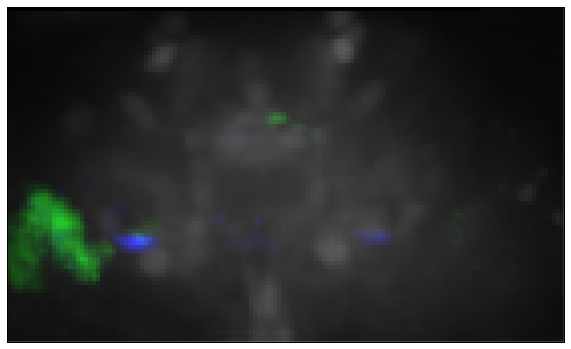

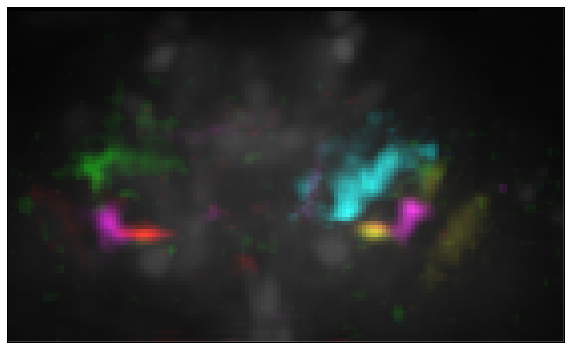

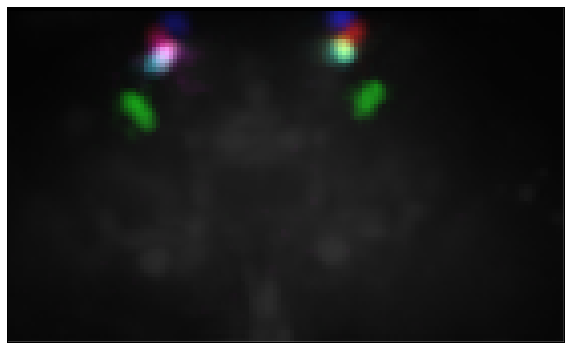

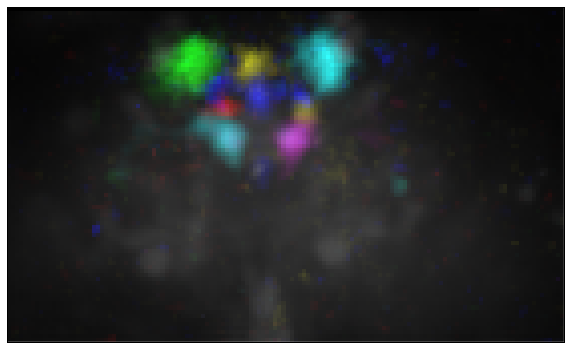

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:29: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:30: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


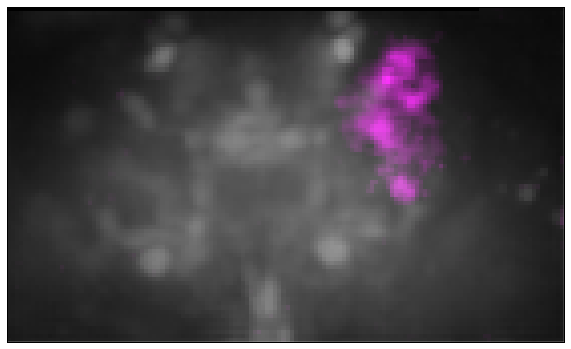

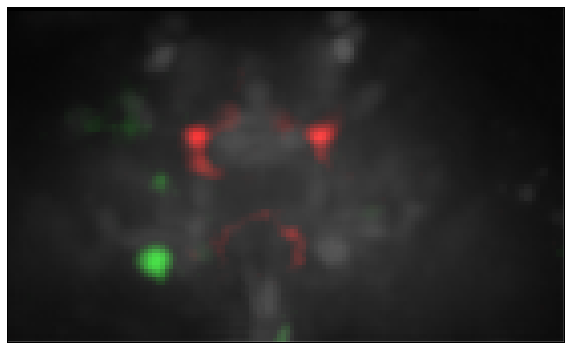

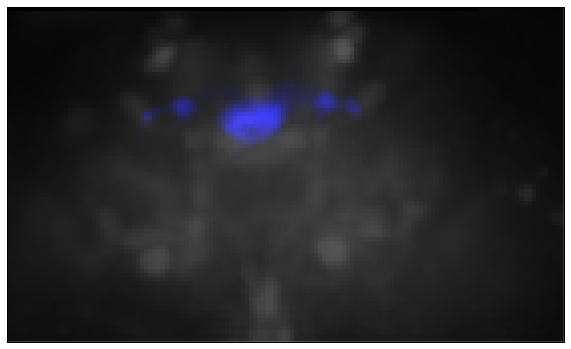

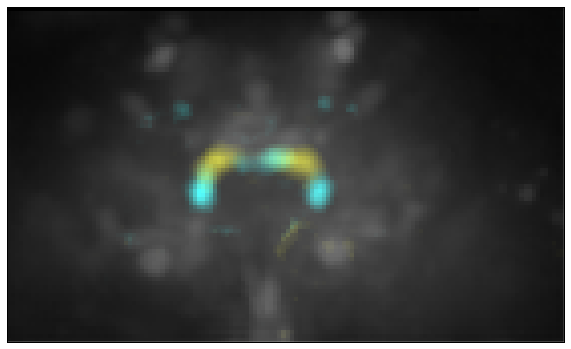

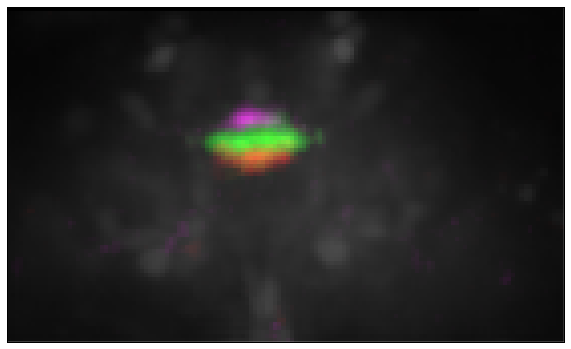

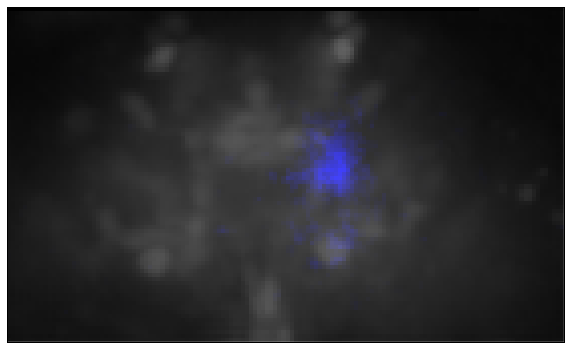

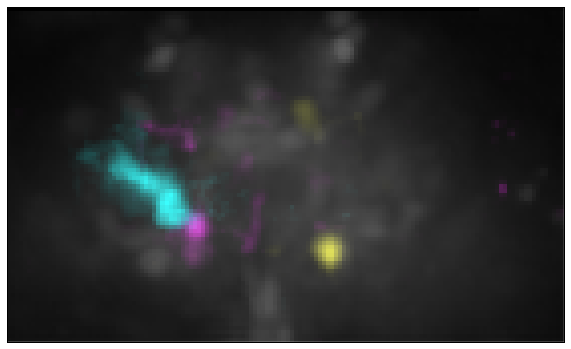

In [112]:
pylab.rcParams['figure.figsize'] = (12, 6)
c=1

for i in range(len(Sets)):
    
    Final_map2=np.zeros([S[0],S[1],3]) 
    Fmaps2=np.zeros([S[0],S[1],3]) 
    Final_map3=np.zeros([S[0],S[1],5,3]) 
    Fmaps3=np.zeros([S[0],S[1],5,3])     
     
    if type(Sets[i])==list:
        for j in np.array(Sets[i]):
            C=np.zeros((S[3],3))
            C[j,:]=C1[c%6][:]
            #print(j)
            for k in range(3):           
                M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]],S[0]*S[1]*5)))
                Fmaps2[:,:,k]=0.9*np.mean(D2o[:,:,:,J[j]],2)*C[j,k]/M
                #M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]]),S[0]*S[1],5))
                #Fmaps3[:,:,:,k]=0.9*D2o[:,:,:,J[j]]*C[j,k]/M                
            Final_map2=Final_map2+Fmaps2
            #Final_map3=Final_map3+Fmaps3 
            c=c+1
                
    else:
        j=Sets[i]
        C[j,:]=C1[c%6][:]
        for k in range(3):           
            M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]],S[0]*S[1]*5)))
            Fmaps2[:,:,k]=0.8*np.mean(D2o[:,:,:,J[j]],2)*C[j,k]/M
        Final_map2=Final_map2+Fmaps2
        c=c+1
        
    Df=np.zeros([S[0],S[1],3]) 
  
    for l in range(3):
        Df[:,:,l]=Final_map2[:,:,l]+np.mean(Dmean,2)/600
    MM=np.max(np.max(Df))

    Rotated=ndimage.rotate(Df[:,:,:]/MM,-90)
    a=plt.imshow(Rotated,cmap=my_cmap,interpolation='none')
    frame1 = plt.gca()
    frame1.axes.get_xaxis().set_visible(False)
    frame1.axes.get_yaxis().set_visible(False)

    plt.show()
                               

In [113]:
Walk=X[:,1]+X[:,2]+X[:,0]
Walk[Walk>0]=1
Walk[Walk<0]=np.nan

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:13: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


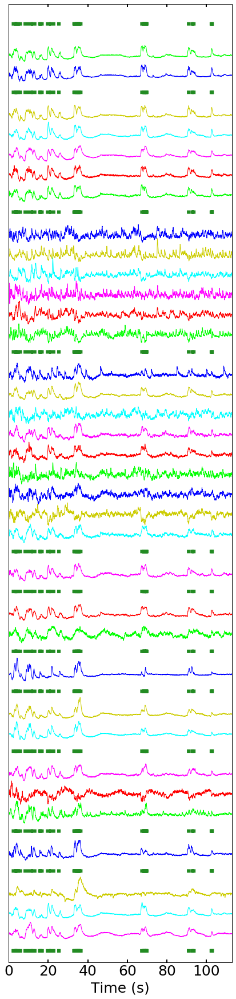

In [115]:
pylab.rcParams['figure.figsize'] = (7, 30)
h=7
l=0
c=1
plt.plot(Time_fluoICA,(Walk)+10,linewidth=6,color='forestgreen')

for i in range(len(Sets)):     
     
    if type(Sets[i])==list:
        for j in np.array(Sets[i]):
            C=np.zeros((S[3],3))
            C[j,:]=C1[c%6][:]
            plt.plot(Time_fluoICA,(DTo[:,J[j]]/np.sqrt(np.var(DTo[:,J[j]]))-h*l-h*i),color=C[j,:])
            l=l+1
            c=c+1
                
    else:
        j=Sets[i]
        C[j,:]=C1[c%6][:]
        plt.plot(Time_fluoICA,(DTo[:,J[j]]/np.sqrt(np.var(DTo[:,J[j]]))-h*l-h*i),color=C[j,:])
        l=l+1
        c=c+1
    plt.plot(Time_fluoICA,(Walk)-h*i-h*l,linewidth=6,color='forestgreen')
        
plt.plot(Time_fluoICA,(Walk)-h*i-h*l,linewidth=6,color='forestgreen')

plt.xlim([np.min(Time_fluoICA),np.max(Time_fluoICA)])
plt.ylim([-h*i-h*l+7-10,18])
frame1 = plt.gca()
frame1.axes.get_yaxis().set_visible(False)
frame1.axes.set_xlabel('Time (s)')
frame1.xaxis.set_tick_params(width=2,length=5)
matplotlib.rcParams.update({'font.size': 25})
plt.savefig('/media/DataPaper/100135/100135imagegraph.svg')
plt.show()

In [331]:
X.shape

(12436, 3)

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:39: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:40: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


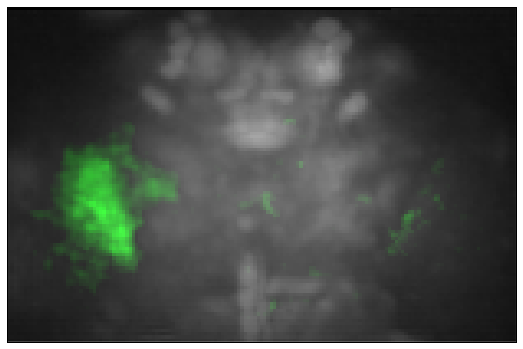

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:17: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:18: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


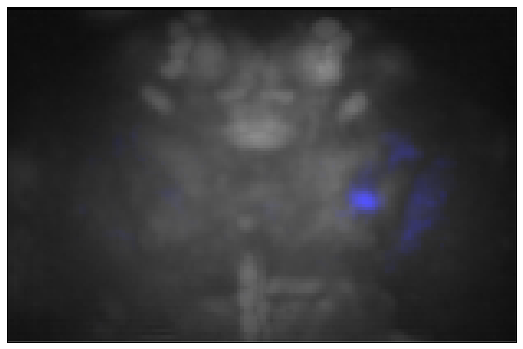

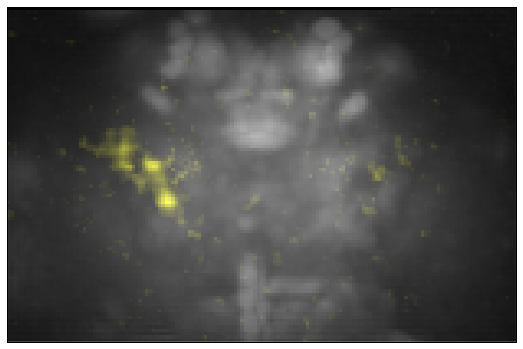

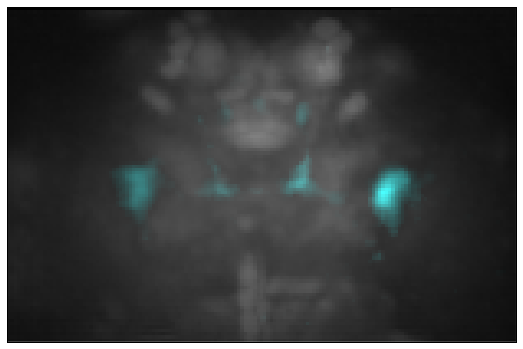

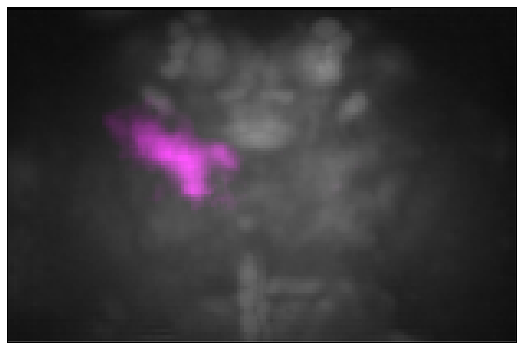

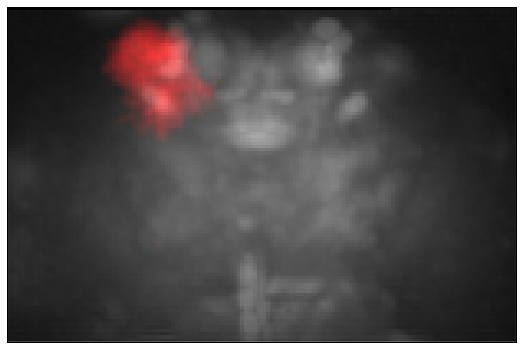

...

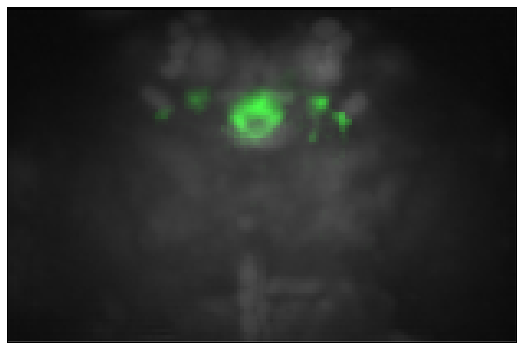

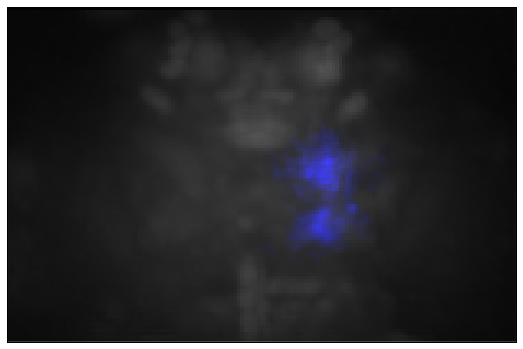

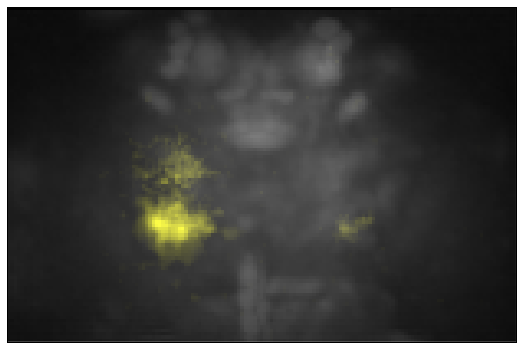

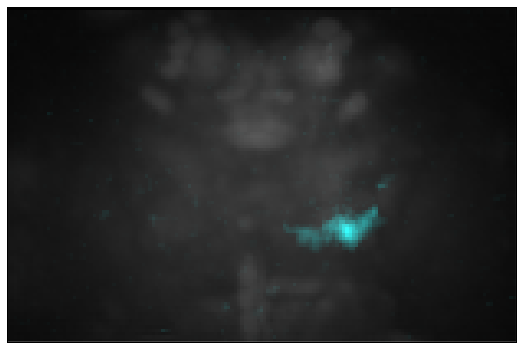

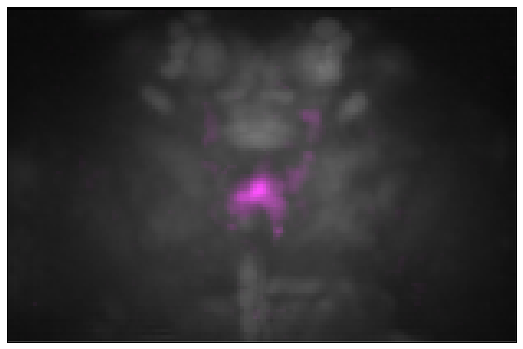

In [355]:
pylab.rcParams['figure.figsize'] = (12, 6)
c=1

for i in range(len(Sets)):
    
    Final_map2=np.zeros([S[0],S[1],3]) 
    Fmaps2=np.zeros([S[0],S[1],3]) 
    Final_map3=np.zeros([S[0],S[1],5,3]) 
    Fmaps3=np.zeros([S[0],S[1],5,3])     
     
    if type(Sets[i])==list:
        for j in np.array(Sets[i]):
            C=np.zeros((S[3],3))
            C[j,:]=C1[c%6][:]
            #print(j)
            for k in range(3):           
                M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]],S[0]*S[1]*5)))
                Fmaps2[:,:,k]=0.9*np.mean(D2o[:,:,:,J[j]],2)*C[j,k]/M
                #M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]]),S[0]*S[1],5))
                #Fmaps3[:,:,:,k]=0.9*D2o[:,:,:,J[j]]*C[j,k]/M                
            Final_map2=Final_map2+Fmaps2
            #Final_map3=Final_map3+Fmaps3 
            c=c+1
            Df=np.zeros([S[0],S[1],3]) 
            for l in range(3):
                Df[:,:,l]=Fmaps2[:,:,l]+np.mean(Dmean,2)/600
            MM=np.max(np.max(Df))

            Rotated=ndimage.rotate(Df[:,:,:]/MM,-90)
            a=plt.imshow(Rotated,cmap=my_cmap,interpolation='none')
            frame1 = plt.gca()
            frame1.axes.get_xaxis().set_visible(False)
            frame1.axes.get_yaxis().set_visible(False)
            plt.show()      
    else:
        j=Sets[i]
        C[j,:]=C1[c%6][:]
        for k in range(3):           
            M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]],S[0]*S[1]*5)))
            Fmaps2[:,:,k]=0.8*np.mean(D2o[:,:,:,J[j]],2)*C[j,k]/M
        Final_map2=Final_map2+Fmaps2
        c=c+1
        Df=np.zeros([S[0],S[1],3]) 
        for l in range(3):
            Df[:,:,l]=Final_map2[:,:,l]+np.mean(Dmean,2)/600
        MM=np.max(np.max(Df))

        Rotated=ndimage.rotate(Df[:,:,:]/MM,-90)
        a=plt.imshow(Rotated,cmap=my_cmap,interpolation='none')
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
        plt.show()
                

(-1, 0)

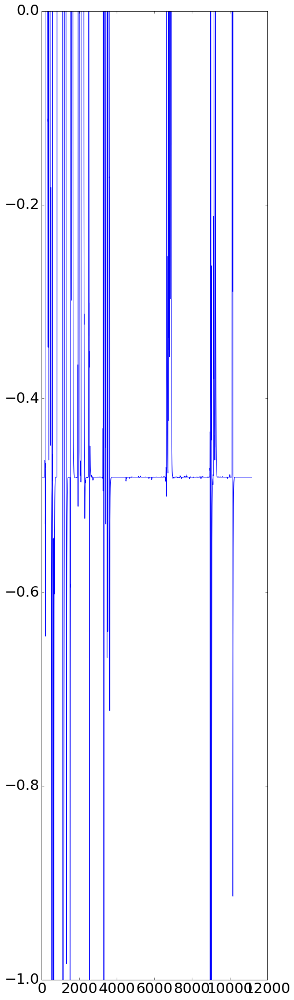

In [123]:
Walk3=X[:,1]+X[:,2]+X[:,0]
plt.plot(Walk3)
plt.ylim(-1,0)

In [124]:
Walk3[Walk3>-0.45]=1
Walk3[Walk3<-0.45]=0

In [125]:
Ion=[]
for i in range(25,(Time_fluoICA.shape[0]-25)):
    if (not Walk3[range(i-20,i)].any()) and Walk3[range(i,i+20)].all():
        Ion.append(i)

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:12: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:24: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


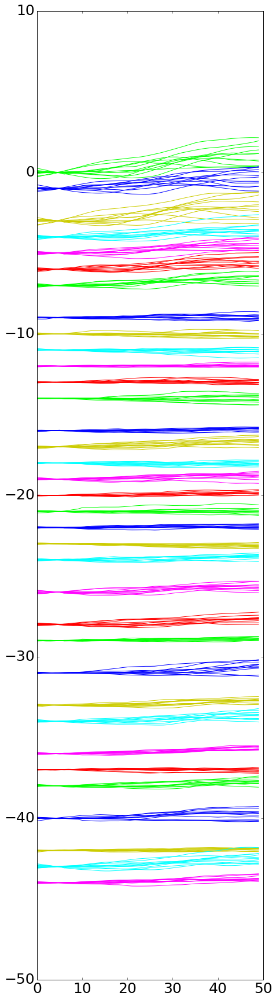

In [127]:
pylab.rcParams['figure.figsize'] = (7, 30)
c=1
l=0
m=0
for i in range(len(Sets)):   
     
    if type(Sets[i])==list:
        for j in np.array(Sets[i]):
            C=np.zeros((S[3],3))
            C[j,:]=C1[c%6][:]
            for k in range(len(Ion)):
                Ts=DTo[range(Ion[k]-25,Ion[k]+25),J[j]]
                Tsm=Ts-np.mean(Ts[range(10)])
                #plt.plot(Time_fluoICA,(DTo[:,J[j]]/np.sqrt(np.var(DTo[:,J[j]]))-h*l-h*i),color=C[j,:])
                plt.plot((-l-m+Tsm*2),color=C[j,:])
            c=c+1
            l=l+1
        m=m+1
                  
    else:
        j=Sets[i]
        C[j,:]=C1[c%6][:]
        for k in range(len(Ion)):
            Ts=DTo[range(Ion[k]-25,Ion[k]+25),J[j]]
            Tsm=Ts-np.mean(Ts[range(10)])
                #plt.plot(Time_fluoICA,(DTo[:,J[j]]/np.sqrt(np.var(DTo[:,J[j]]))-h*l-h*i),color=C[j,:])
            plt.plot((-l-m+Tsm*2),color=C[j,:])
        l=l+1
        c=c+1
        m=m+1
        
plt.show()